In [1]:
""" 
PROGRAM :  diagnostics_basics.ipynb 

reads in CHL assimilation runs, historical simulations 
and raw forecasts under CMIP6 emissions 
to produce some basic diagnostics

STATUS  : Complete 
COMMENTS: (1) No adjusted forecast shown here
"""

' \nPROGRAM :  diagnostics_basics.ipynb \n\nreads in CHL assimilation runs, historical simulations \nand raw forecasts under CMIP6 emissions \nto produce some basic diagnostics\n\nSTATUS  : Complete \nCOMMENTS: (1) No adjusted forecast shown here\n'

In [1]:
import warnings
warnings.filterwarnings('ignore')

from module_data_info import data_module_chl, biomes_module
from module_data_locations import *
from module_data_load import load_data, load_ensemble, load_biomes
from module_data_preprocessing import * 
from module_data_postprocessing import * 
from module_global_averages import * 
from module_metrics import *
from module_plot_lines import *
from module_plot_maps  import *
from module_plot_bars  import plot_bars

In [2]:

unit_change = 1000000 # CMIP6 units --> units
units = r'mg m$^{-3}$' # ???

In [3]:
def nanmasker(ds, dim = 'time', return_mask = False):
    mask = ds.isnull().sum(dim=dim)/len(ds[dim])
    if return_mask:
        return ds * xr.ones_like(mask).where(mask<0.2, np.nan), xr.ones_like(mask).where(mask<0.2, np.nan)
    else:
        return ds * xr.ones_like(mask).where(mask<0.2, np.nan)



In [4]:
print(dir_forecasts_chl)
print(dir_observations_chl)
print(dir_assimilations_chl)
print(dir_assimilations_chl_CanOE)
print(dir_simulations_chl)
print(dir_biomes_chl)

/space/hall5/sitestore/eccc/crd/ccrn/users/rpg002/data/chlos/forecast
/space/hall5/sitestore/eccc/crd/ccrn/users/rpg002/data/chlos/observations
/space/hall5/sitestore/eccc/crd/ccrn/users/rpg002/data/chlos/assimilation
/space/hall5/sitestore/eccc/crd/ccrn/users/rpg002/data/chlos/assimilation/CanOE
/space/hall5/sitestore/eccc/crd/ccrn/users/rpg002/data/chlos/simulation
/space/hall5/sitestore/eccc/crd/ccrn/users/rsa001/big_store/AI/FGCO2/data/biomes


In [5]:
obs_info = data_module_chl(dir_observations_chl)
hnd_info = data_module_chl(dir_forecasts_chl)
asm_info = data_module_chl(dir_assimilations_chl)
asm_CanOE_info = data_module_chl(dir_assimilations_chl_CanOE)
sim_info = data_module_chl(dir_simulations_chl)
bms_info = biomes_module(dir_biomes_chl)
obs_info.PrintLoc()
hnd_info.PrintLoc()
asm_info.PrintLoc()
asm_CanOE_info.PrintLoc()
sim_info.PrintLoc()
bms_info.PrintLoc()

/space/hall5/sitestore/eccc/crd/ccrn/users/rpg002/data/chlos/observations
/space/hall5/sitestore/eccc/crd/ccrn/users/rpg002/data/chlos/forecast
/space/hall5/sitestore/eccc/crd/ccrn/users/rpg002/data/chlos/assimilation
/space/hall5/sitestore/eccc/crd/ccrn/users/rpg002/data/chlos/assimilation/CanOE
/space/hall5/sitestore/eccc/crd/ccrn/users/rpg002/data/chlos/simulation
/space/hall5/sitestore/eccc/crd/ccrn/users/rsa001/big_store/AI/FGCO2/data/biomes


In [6]:
iname = 1 - 1
obs_names = ['ESACCI']  # updated to 2021
obs_name = obs_names[iname]

obs_dict = obs_info.data_dict[obs_name]
asm_dict = asm_info.data_dict['asm']
asm_CanOE_dict = asm_CanOE_info.data_dict['asm_CanOE']
sim_dict = sim_info.data_dict['sim']
hnd_dict = hnd_info.data_dict['hnd']

obs_dir  = obs_dict['dir']
obs_file = obs_dict['file']

asm_dir  = asm_dict['dir']
asm_file = asm_dict['file']

asm_CanOE_dir  = asm_CanOE_dict['dir']
asm_CanOE_file = asm_CanOE_dict['file']

sim_dir  = sim_dict['dir']
sim_file = sim_dict['file']

hnd_dir  = hnd_dict['dir']
hnd_file = hnd_dict['file']

In [7]:
bms_dict = bms_info.data_dict['biomes']
bms_dir  = bms_dict['dir']
bms_file = bms_dict['file']
bms_dict_plot = bms_info.dict_biomes_plot

In [8]:
verbose = True
if verbose:
    print(obs_dir)
    print(hnd_dir)
    print(asm_dir)
    print(sim_dir)

/space/hall5/sitestore/eccc/crd/ccrn/users/rpg002/data/chlos/observations/ESACCI/ESACCI-1M_MONTHLY_1x1_199801-202403.nc
/space/hall5/sitestore/eccc/crd/ccrn/users/rpg002/data/chlos/forecast
/space/hall5/sitestore/eccc/crd/ccrn/users/rpg002/data/chlos/assimilation/chlos_Omon_ensmebles_195801_202312_1x1_LE.nc
/space/hall5/sitestore/eccc/crd/ccrn/users/rpg002/data/chlos/simulation/chlos_Omon_historical_1982_2024_1x1_LE.nc


In [9]:
varx     = 'chlos'
mdl_set  = 'canesm5'   
ensemble_mean = True

In [10]:
dir_out = f'{dir_output_chl}/{obs_name}/results/00_Diagnostics/Basics'

In [11]:
y0_obs = obs_dict['y0'] # ini year avaliable obs
y1_obs = obs_dict['y1'] # end year avaliable obs 

y0_raw = hnd_dict['y0'] # ini year avaliable predictions
y1_raw = hnd_dict['y1'] # end year avaliable predictions

y0_asm = asm_dict['y0'] # ini year avaliable assimilation runs
y1_asm = asm_dict['y1'] # end year avaliable assimilation runs

y0_asm_CanOE = asm_CanOE_dict['y0'] # ini year avaliable assimilation runs
y1_asm_CanOE = asm_CanOE_dict['y1'] # end year avaliable assimilation runs

y0_sim = sim_dict['y0'] # ini year avaliable simulations
y1_sim = sim_dict['y1'] # ini year avaliable simulations

y0_base = 1998          # initial year for base period to compute anomalies
y1_base = 2023          # end     year for base period to compute anomalies

y0_show = 1998            # first initial to show
y1_show = 2023            # last  initial to show

In [12]:
verbose = True
if verbose:
    print("======")
    print(f"y0_obs : {y0_obs}")
    print(f"y1_obs : {y1_obs}")
    print("======")
    print(f"y0_raw : {y0_raw}")
    print(f"y1_raw : {y1_raw}")
    print("======")
    print(f"y0_asm : {y0_asm}")
    print(f"y1_asm : {y1_asm}")
    print("======")
    print(f"y0_asm_CanOE : {y0_asm_CanOE}")
    print(f"y1_asm_CanOE : {y1_asm_CanOE}")
    print("======")
    print(f"y0_sim : {y0_sim}")
    print(f"y1_sim : {y1_sim}")
    print("======")
    print(f"y0_base: {y0_base}")
    print(f"y1_base: {y1_base}")
    print("======")
    print(f"y0_show: {y0_show}")
    print(f"y1_show: {y1_show}")
    print("======")

y0_obs : 1998
y1_obs : 2024
y0_raw : 1991
y1_raw : 2024
y0_asm : 1958
y1_asm : 2023
y0_asm_CanOE : 1958
y1_asm_CanOE : 2023
y0_sim : 1982
y1_sim : 2024
y0_base: 1998
y1_base: 2023
y0_show: 1998
y1_show: 2023


In [13]:
hnd_in = load_ensemble(dir_forecasts_chl,
                        varx,
                        1998,
                        2024,
                        ensemble_mean=ensemble_mean)*unit_change
hnd_in, model_mask = nanmasker(hnd_in, return_mask= True)

loading forecasts..


done


In [14]:
obs_dir = dir_observations_chl + '/ESACCI/ESACCI-1M_MONTHLY_1x1_199801-202403.nc'
obs_in , obs_mask = nanmasker((xr.open_dataset(obs_dir)[varx]), return_mask= True)
obs_in = load_data(obs_dir, varx).isel(lat = slice(None, None, -1))


loading data..
done


In [15]:
asm_in = load_data(asm_dir, varx, ensemble_mean=ensemble_mean) *unit_change

loading data..


done


In [16]:
asm_CanOE_in = load_data(asm_CanOE_dir, varx, ensemble_mean=ensemble_mean) *unit_change

loading data..
done


In [17]:
sim_in = load_data(sim_dir, varx, ensemble_mean=ensemble_mean) *unit_change



loading data..
done


In [18]:
biomes = load_biomes(f'{bms_dir}',
                     f'{bms_file}')
nbms = 17
bms_labels = [bms_info.biomes_dict[ii]['label'] for ii in np.arange(nbms)+1]

loading global ocean biomes..
done


In [19]:
idisplay = False
if idisplay:
    display(biomes)

In [20]:
mask_ocean = (model_mask[0] * obs_mask)

# rewrite data based on target #

In [21]:
hnd_in, obs = rewrite_data_like_obs_on_target(hnd_in, 
                                     obs_in)

obs = xr.concat([obs for _ in range(int(len(hnd_in.time)/12))], dim = 'time').assign_coords(time = hnd_in.time.values)

sim_in = rewrite_data_like_obs_on_target(sim_in, 
                                     obs_in)[0]
sim_in = xr.concat([sim_in for _ in range(int(len(hnd_in.time)/12))], dim = 'time').assign_coords(time = hnd_in.time.values)

asm_in = rewrite_data_like_obs_on_target(asm_in, 
                                     obs_in)[0]

asm_in = xr.concat([asm_in for _ in range((int(len(hnd_in.time)/12)))], dim = 'time').assign_coords(time = hnd_in.time.values)

asm_CanOE_in = rewrite_data_like_obs_on_target(asm_CanOE_in, 
                                     obs_in)[0].sel(year = slice(1980,None))

asm_CanOE_in = xr.concat([asm_CanOE_in for _ in range((int(len(hnd_in.time)/12)))], dim = 'time').assign_coords(time = hnd_in.time.values)

del obs_in


In [22]:
if ensemble_mean:
    hnd_em = hnd_in
    asm_em = asm_in
    asm_CanOE_em = asm_CanOE_in
    sim_em = sim_in
else:
    hnd_em = hnd_in.mean('ensembles')
    asm_em = asm_in.mean('ensembles')
    asm_CanOE_em = asm_CanOE_in.mean('ensembles')
    sim_em = sim_in.mean('ensembles')

del hnd_in, asm_in, sim_in, asm_CanOE_in

In [23]:
idisplay = False
if idisplay:
    display(obs)
    display(hnd_em)
    display(asm_em)
    display(sim_em)

In [27]:
# ddata_LE_bfore = {
#                 'hnd' : hnd_in * mask_ocean,
#                 'asm' : asm_in * mask_ocean,
#                 'sim' : sim_in * mask_ocean,
#                }

ddata_em_bfore = {
                'obs'    : obs * mask_ocean,
                'hindcast_CMOC' : hnd_em * mask_ocean,
                'assim_CMOC' : asm_em * mask_ocean,
                'assim_CanOE' : asm_CanOE_em * mask_ocean,
                'historical_CMOC' : sim_em * mask_ocean,
               }

In [29]:
nldyr = 5

mask_time = np.isnan(ddata_em_bfore['hindcast_CMOC'].sel(time = np.arange(nldyr * 12)).sel(year=slice(y0_show,y1_show)).mean(['lat','lon']))
                                                                                

ddata_em_after = {
                  'obs'     : ddata_em_bfore['obs'].where(~mask_time).sel(time = np.arange(nldyr * 12)).sel(year=slice(y0_show,
                                                                                y1_show)),
                  'assim_CMOC' : ddata_em_bfore['assim_CMOC'].where(~mask_time).sel(time = np.arange(nldyr * 12)).sel(year=slice(y0_show,
                                                                                y1_show)),
                  'assim_CanOE' : ddata_em_bfore['assim_CanOE'].where(~mask_time).sel(time = np.arange(nldyr * 12)).sel(year=slice(y0_show,
                                                                                y1_show)),
                  'hindcast_CMOC'  : ddata_em_bfore['hindcast_CMOC'].where(~mask_time).sel(time = np.arange(nldyr * 12)).sel(year=slice(y0_show,
                                                                                y1_show)),
                  'historical_CMOC' :ddata_em_bfore['historical_CMOC'].where(~mask_time).sel(time = np.arange(nldyr * 12)).sel(year=slice(y0_show,
                                                                                y1_show)),
               }


del ddata_em_bfore

In [30]:
def add_cyclic_point(ds):
    add = ds.isel(lon = -1).assign_coords(lon = ds.isel(lon = -1).lon.values + 1)
    return xr.concat([ds,add], dim = 'lon')

In [31]:
# dict_LE_data = ddata_LE_after
dict_em_data = ddata_em_after

# First rewrite as hindcast then align Data to Common Period #

In [21]:
asm_in = rewrite_data_like_hindcasts(asm_in, 
                                     hnd_in)

sim_in = rewrite_data_like_hindcasts(sim_in, 
                                     hnd_in)

obs = rewrite_data_like_hindcasts(obs_in, 
                                  hnd_in)

del obs_in

In [22]:
if ensemble_mean:
    hnd_em = hnd_in
    asm_em = asm_in
    sim_em = sim_in
else:
    hnd_em = hnd_in.mean('ensembles')
    asm_em = asm_in.mean('ensembles')
    sim_em = sim_in.mean('ensembles')

del hnd_in, asm_in, sim_in

In [23]:
idisplay = False
if idisplay:
    display(obs)
    display(hnd_em)
    display(asm_em)
    display(sim_em)

In [24]:
# ddata_LE_bfore = {
#                 'hnd' : hnd_in * mask_ocean,
#                 'asm' : asm_in * mask_ocean,
#                 'sim' : sim_in * mask_ocean,
#                }

ddata_em_bfore = {
                'obs'    : obs * mask_ocean,
                'hindcast_CMOC' : hnd_em * mask_ocean,
                'assim_CMOC' : asm_em * mask_ocean,
                'historical_CMOC' : sim_em * mask_ocean,
               }

In [ ]:
# ddata_LE_after = {
#                   'hnd'  : align_data_to_common_base(ddata_LE_bfore['hnd'],
#                                                      nldyr=5).sel(year=slice(y0_show,
#                                                                              y1_show)),
#                   ## needs to convert asm and sim to hnd format before alignment..
#                }

In [25]:
ddata_em_after = {
                  'obs'     : align_data_to_common_base(ddata_em_bfore['obs'],
                                                        nldyr=5).sel(year=slice(y0_show,
                                                                                y1_show)),
                  'assim_CMOC' : align_data_to_common_base(ddata_em_bfore['assim_CMOC'],
                                                        nldyr=5).sel(year=slice(y0_show,
                                                                                y1_show)),
                  'hindcast_CMOC'  : align_data_to_common_base(ddata_em_bfore['hindcast_CMOC'],
                                                        nldyr=5).sel(year=slice(y0_show,
                                                                                y1_show)),
                  'historical_CMOC' : align_data_to_common_base(ddata_em_bfore['historical_CMOC'],
                                                        nldyr=5).sel(year=slice(y0_show,
                                                                                y1_show)),
               }

del ddata_em_bfore

In [ ]:
# dict_LE_data = ddata_LE_after
dict_em_data = ddata_em_after


# Set clim, glbavg, anom, and var #

In [32]:
mask_ocean = mask_ocean.fillna(0)
dict_glbavg_NH = {
               'obs'    : area_weighted_avg(dict_em_data['obs'],
                                        mask=mask_ocean, H = 'North'),
               'assim_CMOC' : area_weighted_avg(dict_em_data['assim_CMOC'],
                                        mask=mask_ocean, H = 'North'),  
               'assim_CanOE' : area_weighted_avg(dict_em_data['assim_CanOE'],
                                        mask=mask_ocean, H = 'North'),                   
               'hindcast_CMOC': area_weighted_avg(dict_em_data['hindcast_CMOC'],
                                        mask=mask_ocean, H = 'North'),
               'historical_CMOC': area_weighted_avg(dict_em_data['historical_CMOC'],
                                        mask=mask_ocean, H = 'North')
               }

dict_glbavg_SH = {
               'obs'    : area_weighted_avg(dict_em_data['obs'],
                                        mask=mask_ocean, H = 'South'),
               'assim_CMOC' : area_weighted_avg(dict_em_data['assim_CMOC'],
                                        mask=mask_ocean, H = 'South'),           
               'assim_CanOE' : area_weighted_avg(dict_em_data['assim_CanOE'],
                                        mask=mask_ocean, H = 'South'),           
               'hindcast_CMOC': area_weighted_avg(dict_em_data['hindcast_CMOC'],
                                        mask=mask_ocean, H = 'South'),
               'historical_CMOC': area_weighted_avg(dict_em_data['historical_CMOC'],
                                        mask=mask_ocean, H = 'South')
               }



dict_clim = {
               'obs' : get_climatology_on_base(dict_em_data['obs'],
                                               y0_base,
                                               y1_base,
                                               ltime_dep=False,  # already aligned to target
                                               full_set=False),  # already aligned to target
               'assim_CMOC' : get_climatology_on_base(dict_em_data['assim_CMOC'],
                                               y0_base,
                                               y1_base,
                                               ltime_dep=False,  # already aligned to target
                                               full_set=False),  # already aligned to target
               'assim_CanOE' : get_climatology_on_base(dict_em_data['assim_CanOE'],
                                               y0_base,
                                               y1_base,
                                               ltime_dep=False,  # already aligned to target
                                               full_set=False),  # already aligned to target
               'hindcast_CMOC': get_climatology_on_base(dict_em_data['hindcast_CMOC'],
                                               y0_base,
                                               y1_base,
                                               ltime_dep=False,  # already aligned to target
                                               full_set=False),  # already aligned to target
               'historical_CMOC': get_climatology_on_base(dict_em_data['historical_CMOC'],
                                               y0_base,
                                               y1_base,
                                               ltime_dep=False,  # already aligned to target
                                               full_set=False),  # already aligned to target
            }
dict_anom = {
                  'obs'    : dict_em_data['obs']    - dict_clim['obs'],
                  'assim_CMOC' : dict_em_data['assim_CMOC'] - dict_clim['assim_CMOC'],
                  'assim_CanOE' : dict_em_data['assim_CanOE'] - dict_clim['assim_CanOE'],
                  'hindcast_CMOC' : dict_em_data['hindcast_CMOC'] - dict_clim['hindcast_CMOC'],
                  'historical_CMOC' : dict_em_data['historical_CMOC'] - dict_clim['historical_CMOC'], 
             }

dict_clim_glbavg_NH = {
               'obs'    : area_weighted_avg(dict_clim['obs'],
                                        mask=mask_ocean, H = 'North'),
               'assim_CMOC' : area_weighted_avg(dict_clim['assim_CMOC'],
                                        mask=mask_ocean, H = 'North'),  
               'assim_CanOE' : area_weighted_avg(dict_clim['assim_CanOE'],
                                        mask=mask_ocean, H = 'North'),                                                
               'hindcast_CMOC' : area_weighted_avg(dict_clim['hindcast_CMOC'],
                                        mask=mask_ocean, H = 'North'),                     
               'historical_CMOC' : area_weighted_avg(dict_clim['historical_CMOC'],
                                        mask=mask_ocean, H = 'North'),                     
               }

dict_clim_glbavg_SH = {
               'obs'    : area_weighted_avg(dict_clim['obs'],
                                        mask=mask_ocean, H = 'South'),
               'assim_CMOC' : area_weighted_avg(dict_clim['assim_CMOC'],
                                        mask=mask_ocean, H = 'South'),  
               'assim_CanOE' : area_weighted_avg(dict_clim['assim_CanOE'],
                                        mask=mask_ocean, H = 'South'),                                            
               'hindcast_CMOC' : area_weighted_avg(dict_clim['hindcast_CMOC'],
                                        mask=mask_ocean, H = 'South'),                     
               'simhistorical_CMOC_em' : area_weighted_avg(dict_clim['historical_CMOC'],
                                        mask=mask_ocean, H = 'South'),                     
               }


dict_var = {
                  'obs'    : dict_anom['obs'].var(dim='year'),
                  'assim_CMOC' : dict_anom['assim_CMOC'].var(dim='year'),
                  'assim_CanOE' : dict_anom['assim_CanOE'].var(dim='year'),
                  'hindcast_CMOC' : dict_anom['hindcast_CMOC'].var(dim='year'),
                  # 'hnd'    : (dict_LE_data['hnd']-dict_clim['hindcast_CMOC']).var(dim='year').mean(dim='ensembles'), 
                  'historical_CMOC' : dict_anom['historical_CMOC'].var(dim='year'), 
             }

dict_var_glbavg_NH = {
                  'obs'    : area_weighted_avg(dict_var['obs'],
                                               mask=mask_ocean, H = 'North'),
                  'assim_CMOC' : area_weighted_avg(dict_var['assim_CMOC'],
                                               mask=mask_ocean, H = 'North'),
                  'assim_CanOE' : area_weighted_avg(dict_var['assim_CanOE'],
                                               mask=mask_ocean, H = 'North'),
                  'hindcast_CMOC' : area_weighted_avg(dict_var['hindcast_CMOC'],
                                               mask=mask_ocean, H = 'North'),
               #    'hnd' : area_weighted_avg(dict_var['hnd'],
               #                              mask=mask_ocean, H = 'North'),
                  'historical_CMOC' : area_weighted_avg(dict_var['historical_CMOC'],
                                               mask=mask_ocean, H = 'North'),
                   }

dict_var_glbavg_SH = {
                  'obs'    : area_weighted_avg(dict_var['obs'],
                                               mask=mask_ocean, H = 'South'),
                  'assim_CMOC' : area_weighted_avg(dict_var['assim_CMOC'],
                                               mask=mask_ocean, H = 'South'),
                  'assim_CanOE' : area_weighted_avg(dict_var['assim_CanOE'],
                                               mask=mask_ocean, H = 'South'),
                  'hindcast_CMOC' : area_weighted_avg(dict_var['hindcast_CMOC'],
                                               mask=mask_ocean, H = 'South'),
               #    'hnd' : area_weighted_avg(dict_var['hnd'],
               #                              mask=mask_ocean, H = 'North'),
                  'historical_CMOC' : area_weighted_avg(dict_var['historical_CMOC'],
                                               mask=mask_ocean, H = 'South'),
                   }

In [33]:
ds_list = ['obs','hindcast_CMOC' ,'assim_CMOC','assim_CanOE', 'historical_CMOC']
dict_avg_biomes = {}

for ii,bm_label in enumerate(bms_labels):

    dict_avg_biomes[bm_label] = {}

    biome = biomes.MeanBiomes.where(biomes.MeanBiomes == ii+1)
    biome =spatial_mask(biome.to_dataset()) * mask_ocean
 
    dict_avg_biomes[bm_label] = {} 
    for ds_source in ds_list:
                 
        # values = area_weighted_avg(dict_am[ds][ds_type],
        #                            mask=mask_ocean)[var]#.values
        values = area_weighted_avg(dict_em_data[ds_source],
                                    mask=biome,
                                    integral=False)#.values
            
        dict_avg_biomes[bm_label][ds_source] = values        

dict_clim_avg_biomes = {}
for ii,bm_label in enumerate(bms_labels):

    dict_clim_avg_biomes[bm_label] = {}


    biome = biomes.MeanBiomes.where(biomes.MeanBiomes == ii+1)
    biome =spatial_mask(biome.to_dataset()) * mask_ocean
 
    dict_clim_avg_biomes[bm_label] = {} 
    for ds_source in ds_list:
                 
        # values = area_weighted_avg(dict_am[ds][ds_type],
        #                            mask=mask_ocean)[var]#.values
        values =  area_weighted_avg(dict_clim[ds_source],
                                        mask=biome)
            
        dict_clim_avg_biomes[bm_label][ds_source] = values      


dict_anom_avg_biomes = {}

for ii,bm_label in enumerate(bms_labels):

    dict_anom_avg_biomes[bm_label] = {}

    biome = biomes.MeanBiomes.where(biomes.MeanBiomes == ii+1)
    biome =spatial_mask(biome.to_dataset()) * mask_ocean
 
    dict_anom_avg_biomes[bm_label] = {} 
    for ds_source in ds_list:
                 
        # values = area_weighted_avg(dict_am[ds][ds_type],
        #                            mask=mask_ocean)[var]#.values
        values = area_weighted_avg(dict_anom[ds_source],
                                    mask=biome,
                                    integral=False)#.values
            
        dict_anom_avg_biomes[bm_label][ds_source] = values   

dict_var_avg_biomes = {}
for ii,bm_label in enumerate(bms_labels):

    dict_var_avg_biomes[bm_label] = {}


    biome = biomes.MeanBiomes.where(biomes.MeanBiomes == ii+1)
    biome =spatial_mask(biome.to_dataset()) * mask_ocean
 
    dict_var_avg_biomes[bm_label] = {} 
    for ds_source in ds_list:
                 
        # values = area_weighted_avg(dict_am[ds][ds_type],
        #                            mask=mask_ocean)[var]#.values
        values =  area_weighted_avg(dict_var[ds_source],
                                        mask=biome)
            
        dict_var_avg_biomes[bm_label][ds_source] = values     





# Biomes #

Ocean mask used:

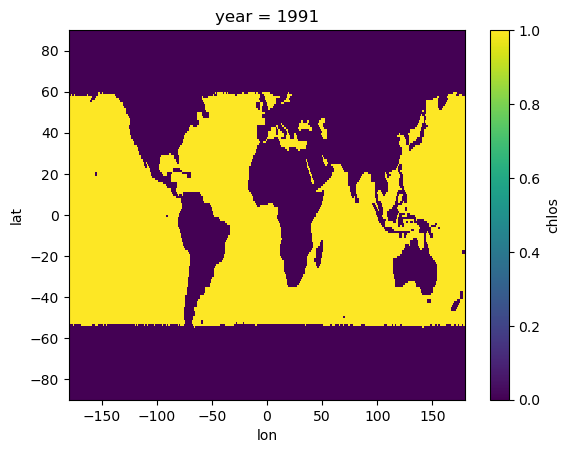

In [30]:
mask_ocean.plot()

The BGC biomes from Fay & McKineley 2014:

In [ ]:
biomes.MeanBiomes.plot()

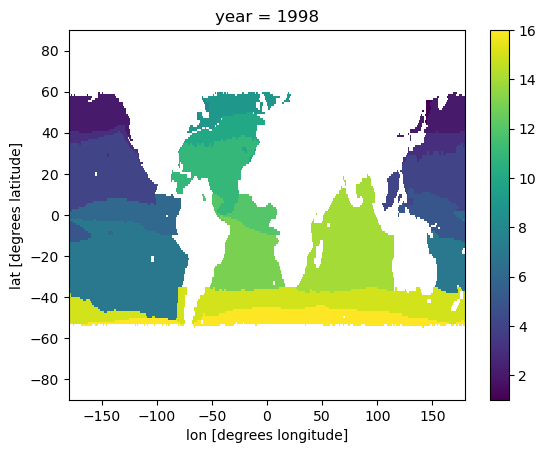

In [42]:
b = (biomes.MeanBiomes * mask_ocean).where(biomes.MeanBiomes * mask_ocean > 0)
b.plot()

# Seasonal Cycle: Climatology and Variance year 1#

In [34]:
ds_list = [
           'obs',
           'assim_CMOC',
           'assim_CanOE',
           'hindcast_CMOC',
           'historical_CMOC'
          ]

dict_color = { 'obs'    : obs_dict['color'],
               'assim_CMOC' : asm_dict['color'],
                'assim_CanOE' : asm_CanOE_dict['color'],
               'hindcast_CMOC' : hnd_dict['color'],
               'historical_CMOC' : sim_dict['color'],
              }


Northern hemisphere seasonal climatology:

In [ ]:


dict_to_show = {}
for ds in ds_list:
    dict_to_show[ds] = dict_clim_glbavg_NH[ds].sel(time=slice(0,11))
   
    
xlim_min = -1
xlim_max = 12
xticks_step = 1
    
file_out = f'ts_seasonal_cycle_climatology_basics'
title = f'Climatology, chlos, NH'
plot_ts_vs_lead(ds_list,        
              dict_to_show,
              color_dict=dict_color,
              ylim_min=0.1,
              ylim_max=0.35,
              xlim_min=xlim_min,
              xlim_max=xlim_max,
              xticks_step=xticks_step,
              xlabel='forecast month',
              ylabel=f'{units}',
              title=title,
              bbox=(.9,.5,.5,.5),
              fontsize=12,              
              dir_name=dir_out,
              file_name=file_out,
              show=True,
              save=True)

Southern hemisphere seasonal climatology:

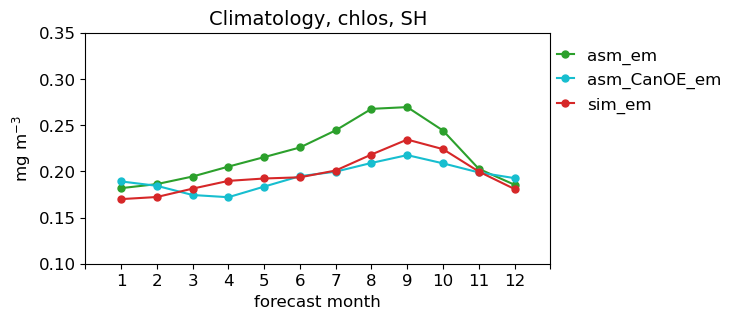

In [195]:
dict_to_show = {}
for ds in ds_list:
    dict_to_show[ds] = dict_clim_glbavg_SH[ds].sel(time=slice(0,11))
   
    
xlim_min = -1
xlim_max = 12
xticks_step = 1
    
file_out = f'ts_seasonal_cycle_climatology_basics'
title = f'Climatology, chlos, SH'
plot_ts_vs_lead(ds_list,        
              dict_to_show,
              color_dict=dict_color,
              ylim_min=0.1,
              ylim_max=0.35,
              xlim_min=xlim_min,
              xlim_max=xlim_max,
              xticks_step=xticks_step,
              xlabel='forecast month',
              ylabel=f'{units}',
              title=title,
              bbox=(.9,.5,.5,.5),
              fontsize=12,              
              dir_name=dir_out,
              file_name=file_out,
              show=True,
              save=True)

Biome specific seasonal climatology:

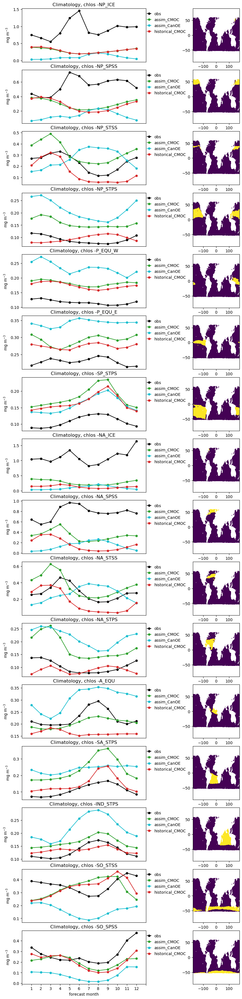

In [35]:
dict_to_show = {}
for bms_label in bms_labels:
    dict_to_show[bms_label] = {}
    for ds in ds_list:
        dict_to_show[bms_label][ds] = dict_clim_avg_biomes[bms_label][ds].sel(time=slice(0,11))
   
    
xlim_min = -1
xlim_max = 12
xticks_step = 1
    
file_out = f'ts_seasonal_cycle_climatology_basics'
title = f'Climatology, chlos '
plot_ts_vs_lead_biomes(['obs','assim_CMOC','assim_CanOE', 'historical_CMOC'],        
              dict_to_show,
              biomes = biomes.MeanBiomes * mask_ocean.where(mask_ocean>0),
              bms_labels=bms_labels,
              color_dict=dict_color,
              xlim_min=xlim_min,
              xlim_max=xlim_max,
              figsize= (10,45),
              xticks_step=xticks_step,
              xlabel='forecast month',
              ylabel=f'{units}',
              title=title,
              bbox=(.85,.5,.5,.5),
              fontsize=10,              
              dir_name=dir_out,
              file_name=file_out,
              show=True,
              save=True)

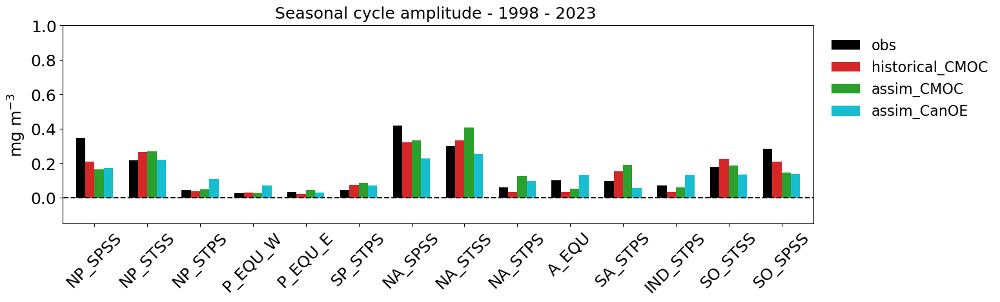

In [46]:
dict_to_show_std = {}
for ds in ['obs', 'historical_CMOC','assim_CMOC', 'assim_CanOE']:
    if ds != 'hindcast_CMOC':
        dict_to_show_std[ds] = {}
        for bm_label in bms_labels:
            if 'ICE' not in bm_label:
                dict_to_show_std[ds][bm_label] = dict_to_show[bm_label][ds].max('time').values - dict_to_show[bm_label][ds].min('time').values 

plot_bars(dict_to_show_std,
        title=f'Seasonal cycle amplitude - {y0_show} - {y1_show} ',
        ylabel=f'{units}',
        bbox=(0.75,.5,.5,.5),
        figsize=(15, 4),
        leg=True,
        dir_name=dir_out,
        color_dict = dict_color,
        #   file_name=file_out,
        show=True,
        save=False)    



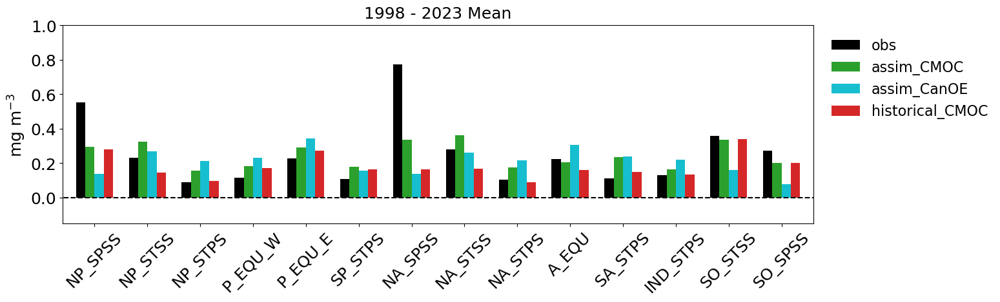

In [37]:
dict_to_show_mean = {}
for ds in ['obs','assim_CMOC', 'assim_CanOE', 'historical_CMOC']:
    if ds != 'hindcast_CMOC':
        dict_to_show_mean[ds] = {}
        for bm_label in bms_labels:
            if 'ICE' not in bm_label:
                dict_to_show_mean[ds][bm_label] = float(dict_to_show[bm_label][ds].mean('time').values)

plot_bars(dict_to_show_mean,
        title=f' {y0_show} - {y1_show} Mean ',
        ylabel=f'{units}',
        bbox=(0.75,.5,.5,.5),
        figsize=(15, 4),
        leg=True,
        dir_name=dir_out,
        color_dict = dict_color,
        #   file_name=file_out,
        show=True,
        save=False)    



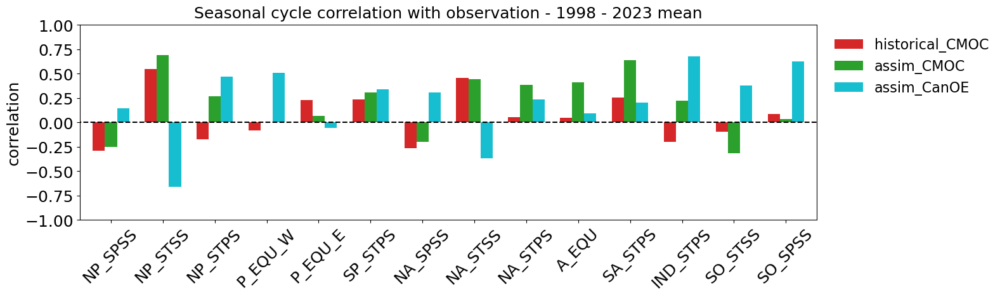

In [43]:
dict_clim_corr_avg_biomes = {}

    
        
for ds_source in ['historical_CMOC','assim_CMOC', 'assim_CanOE']:
    dict_clim_corr_avg_biomes[ds_source] = {} 
    ds = xr.corr(dict_clim[ds_source].sel(time=slice(0,11)), dict_clim['obs'].sel(time=slice(0,11)), dim = 'time')         
    for ii,bm_label in enumerate(bms_labels):
        if 'ICE' not in bm_label:

            biome = biomes.MeanBiomes.where(biomes.MeanBiomes == ii+1)
            biome =spatial_mask(biome.to_dataset()) * mask_ocean

            values =  area_weighted_avg(ds,
                                            mask=biome).values
                
            dict_clim_corr_avg_biomes[ds_source][bm_label] = float(values)      


plot_bars(dict_clim_corr_avg_biomes,
        title=f'Seasonal cycle correlation with observation - {y0_show} - {y1_show} mean',
        ylabel=f'correlation',
        bbox=(0.75,.5,.5,.5),
        ylim = (-1,1),
        figsize=(15, 4),
        color_dict = dict_color,
        leg=True,
        dir_name=dir_out,
        #   file_name=file_out,
        show=True,
        save=False)    



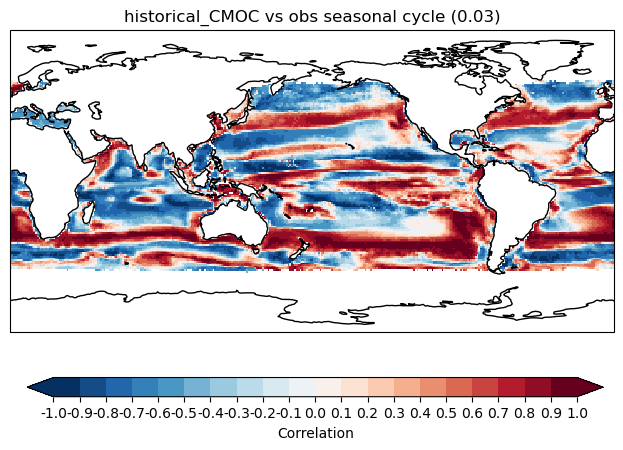

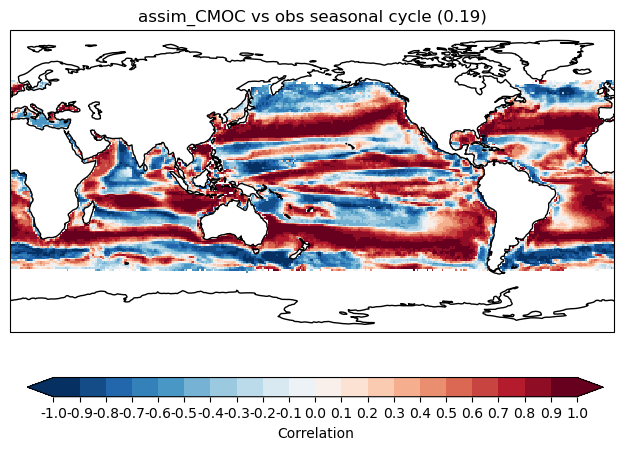

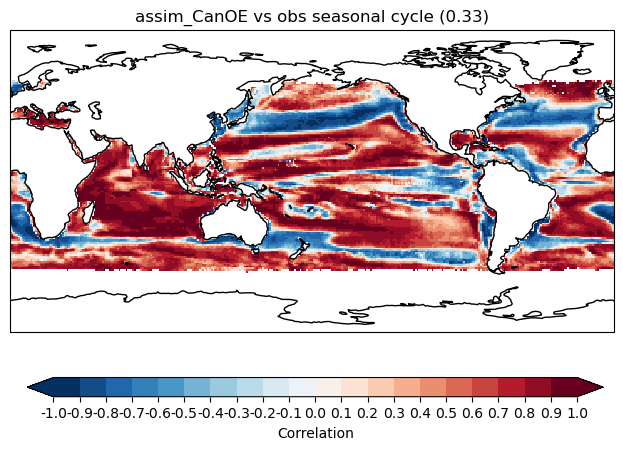

In [38]:
for ds_source in ['historical_CMOC','assim_CMOC','assim_CanOE']:
    ds = xr.corr(dict_clim[ds_source].sel(time=slice(0,11)), dict_clim['obs'].sel(time=slice(0,11)), dim = 'time')   
    ds = add_cyclic_point(ds)   
    plot_single_map_wmo((ds),lat=ds.lat,lon=ds.lon,central_longitude=-180,lat_lims=[-90,90],cmap=mpl.cm.RdBu_r,vmin=-1,vmax=1,cbar_label='Correlation',title = f'{ds_source} vs obs seasonal cycle' , figsize=None, show = True,cbar=True,nvals=20,)


Northern hemisphere monthly std across years:

In [ ]:
ds_list = [
           'obs',
           'assim_CMOC',
           'hindcast_CMOC',
        #    'hnd',
           'historical_CMOC'
          ]

dict_color = { 'obs'    : obs_dict['color'],
               'assim_CMOC' : asm_dict['color'],
               'hindcast_CMOC' : hnd_dict['color'],
            #    'hnd'    : "tab:orange",
               'historical_CMOC' : sim_dict['color'],
              }


dict_to_show = {}
for ds in ds_list:
    dict_to_show[ds] = dict_var_glbavg_NH[ds].sel(time=slice(0,11))
xlim_min = -1
xlim_max = 12
xticks_step = 1

file_out = f'ts_seasonal_cycle_climatology_basics'
title = f'Climatological Variance, chlos, NH'
plot_ts_vs_lead(ds_list,        
              dict_to_show,
              color_dict=dict_color,
            #   ylim_min=0.2,
            #   ylim_max=0.55,
              xlim_min=xlim_min,
              xlim_max=xlim_max,
              xticks_step=xticks_step,
              xlabel='forecast month',
              ylabel=f'({units}) $^{2}$',
              title=title,
              bbox=(.78,.5,.5,.5),
              fontsize=12,              
              dir_name=dir_out,
              file_name=file_out,
              show=True,
              save=False)

Northern hemisphere monthly std across years:

In [ ]:
dict_to_show = {}
for ds in ds_list:
    dict_to_show[ds] = dict_var_glbavg_SH[ds].sel(time=slice(0,11))
xlim_min = -1
xlim_max = 12
xticks_step = 1

file_out = f'ts_seasonal_cycle_climatology_basics'
title = f'Climatological Variance, chlos, SH'
plot_ts_vs_lead(ds_list,        
              dict_to_show,
              color_dict=dict_color,
            #   ylim_min=0.2,
            #   ylim_max=0.55,
              xlim_min=xlim_min,
              xlim_max=xlim_max,
              xticks_step=xticks_step,
              xlabel='forecast month',
              ylabel=f'({units}) $^{2}$',
              title=title,
              bbox=(.78,.5,.5,.5),
              fontsize=12,              
              dir_name=dir_out,
              file_name=file_out,
              show=True,
              save=False)

Biome specific monthly std across years:

In [ ]:
dict_to_show = {}
for bms_label in bms_labels:
    dict_to_show[bms_label] = {}
    for ds in ds_list:
        dict_to_show[bms_label][ds] = dict_var_avg_biomes[bms_label][ds].sel(time=slice(0,11))
   
    
xlim_min = -1
xlim_max = 12
xticks_step = 1
    
file_out = f'ts_seasonal_cycle_var_basics'
title = f'Variance, chlos '
plot_ts_vs_lead_biomes(ds_list,        
              dict_to_show,
              biomes = biomes.MeanBiomes * mask_ocean.where(mask_ocean>0),
              bms_labels=bms_labels,
              color_dict=dict_color,
              xlim_min=xlim_min,
              xlim_max=xlim_max,
              figsize= (10,45),
              xticks_step=xticks_step,
              xlabel='forecast month',
              ylabel=f'({units}) $^{2}$',
              title=title,
              bbox=(.85,.5,.5,.5),
              fontsize=10,              
              dir_name=dir_out,
              file_name=file_out,
              show=True,
              save=True)

# Global Means #

In [76]:

# dict_em_ts_NH = { 'obs'     : { 'ts'        : area_weighted_avg(dict_em_data['obs'], H = 'North',mask=mask_ocean,
#                                                              integral=False),
#                              'color'     : obs_dict['color'],
#                              'linestyle' : '-',
#                             },
#                'assim_CMOC'  : { 'ts'        : area_weighted_avg(dict_em_data['assim_CMOC'],H = 'North',mask=mask_ocean,
#                                                              integral=False),
#                              'color'     : asm_dict['color'],
#                              'linestyle' : '-',
#                            },
#                 'assim_CanOE'  : { 'ts'        : area_weighted_avg(dict_em_data['assim_CanOE'],H = 'North',mask=mask_ocean,
#                                                              integral=False),
#                              'color'     : asm_CanOE_dict['color'],
#                              'linestyle' : '-',
#                            },
#                'hindcast_CMOC' : { 'ts'        : area_weighted_avg(dict_em_data['hindcast_CMOC'],H = 'North',mask=mask_ocean,
#                                                              integral=False),
#                              'color'     : hnd_dict['color'],
#                              'linestyle' : '-',
#                      },
#                'historical_CMOC' : { 'ts'    : area_weighted_avg(dict_em_data['historical_CMOC'],H = 'North',mask=mask_ocean,
#                                                              integral=False),
#                              'color'     : sim_dict['color'],
#                              'linestyle' : '-',
#                      },
#             }

# dict_em_anom_ts_NH = { 'obs'     : { 'ts'        : area_weighted_avg(dict_anom['obs'], H = 'North',mask=mask_ocean,
#                                                              integral=False),
#                              'color'     : obs_dict['color'],
#                              'linestyle' : '-',
#                             },
#                'assim_CMOC'  : { 'ts'        : area_weighted_avg(dict_anom['assim_CMOC'],H = 'North',mask=mask_ocean,
#                                                              integral=False),
#                              'color'     : asm_dict['color'],
#                              'linestyle' : '-',
#                            },
#                'assim_CanOE'  : { 'ts'        : area_weighted_avg(dict_anom['assim_CanOE'],H = 'North',mask=mask_ocean,
#                                                              integral=False),
#                              'color'     : asm_CanOE_dict['color'],
#                              'linestyle' : '-',
#                            },                           
#                'hindcast_CMOC' : { 'ts'        : area_weighted_avg(dict_anom['hindcast_CMOC'],H = 'North',mask=mask_ocean,
#                                                              integral=False),
#                              'color'     : hnd_dict['color'],
#                              'linestyle' : '-',
#                      },
#                'historical_CMOC' : { 'ts'    : area_weighted_avg(dict_anom['historical_CMOC'],H = 'North',mask=mask_ocean,
#                                                              integral=False),
#                              'color'     : sim_dict['color'],
#                              'linestyle' : '-',
#                      },
#             }

# dict_em_ts_SH = { 'obs'     : { 'ts'        : area_weighted_avg(dict_em_data['obs'], H = 'South',mask=mask_ocean,
#                                                              integral=False),
#                              'color'     : obs_dict['color'],
#                              'linestyle' : '-',
#                             },
#                'assim_CMOC'  : { 'ts'        : area_weighted_avg(dict_em_data['assim_CMOC'],H = 'South',mask=mask_ocean,
#                                                              integral=False),
#                              'color'     : asm_dict['color'],
#                              'linestyle' : '-',
#                            },
#                'assim_CanOE'  : { 'ts'        : area_weighted_avg(dict_em_data['assim_CanOE'],H = 'South',mask=mask_ocean,
#                                                              integral=False),
#                              'color'     : asm_CanOE_dict['color'],
#                              'linestyle' : '-',
#                            },                           
#                'hindcast_CMOC' : { 'ts'        : area_weighted_avg(dict_em_data['hindcast_CMOC'],H = 'South',mask=mask_ocean,
#                                                              integral=False),
#                              'color'     : hnd_dict['color'],
#                              'linestyle' : '-',
#                      },
#                'historical_CMOC' : { 'ts'    : area_weighted_avg(dict_em_data['historical_CMOC'],H = 'South',mask=mask_ocean,
#                                                              integral=False),
#                              'color'     : sim_dict['color'],
#                              'linestyle' : '-',
#                      },
#             }

# dict_em_anom_ts_SH = { 'obs'     : { 'ts'        : area_weighted_avg(dict_anom['obs'], H = 'South',mask=mask_ocean,
#                                                              integral=False),
#                              'color'     : obs_dict['color'],
#                              'linestyle' : '-',
#                             },
#                'assim_CMOC'  : { 'ts'        : area_weighted_avg(dict_anom['assim_CMOC'],H = 'South',mask=mask_ocean,
#                                                              integral=False),
#                              'color'     : asm_dict['color'],
#                              'linestyle' : '-',
#                            },
#                 'assim_CanOE'  : { 'ts'        : area_weighted_avg(dict_anom['assim_CanOE'],H = 'South',mask=mask_ocean,
#                                                              integral=False),
#                              'color'     : asm_CanOE_dict['color'],
#                              'linestyle' : '-',
#                            },
#                'hindcast_CMOC' : { 'ts'        : area_weighted_avg(dict_anom['hindcast_CMOC'],H = 'South',mask=mask_ocean,
#                                                              integral=False),
#                              'color'     : hnd_dict['color'],
#                              'linestyle' : '-',
#                      },
#                'historical_CMOC' : { 'ts'    : area_weighted_avg(dict_anom['historical_CMOC'],H = 'South',mask=mask_ocean,
#                                                              integral=False),
#                              'color'     : sim_dict['color'],
#                              'linestyle' : '-',
#                      },
#             }


In [161]:
dict_em_ts_biomes = {}

for ii, bms_label in enumerate(bms_labels):
        
        biome = biomes.MeanBiomes.where(biomes.MeanBiomes == ii+1)
        biome =spatial_mask(biome.to_dataset()) * mask_ocean
               
        dict_em_ts_biomes[bms_label] = { 'obs'     : { 'ts'        : area_weighted_avg(dict_em_data['obs'], mask=biome,
                                                                integral=False),
                                'color'     : obs_dict['color'],
                                'linestyle' : '-',
                                },
                'assim_CMOC'  : { 'ts'        : area_weighted_avg(dict_em_data['assim_CMOC'], mask=biome,
                                                                integral=False),
                                'color'     : asm_dict['color'],
                                'linestyle' : '-',
                                },
                'assim_CanOE'  : { 'ts'        : area_weighted_avg(dict_em_data['assim_CanOE'], mask=biome,
                                                                integral=False),
                                'color'     : asm_CanOE_dict['color'],
                                'linestyle' : '-',
                                },
                'hindcast_CMOC' : { 'ts'        : area_weighted_avg(dict_em_data['hindcast_CMOC'], mask=biome,
                                                                integral=False),
                                'color'     : hnd_dict['color'],
                                'linestyle' : '-',
                        },
                'historical_CMOC' : { 'ts'    : area_weighted_avg(dict_em_data['historical_CMOC'], mask=biome,
                                                                integral=False),
                                'color'     : sim_dict['color'],
                                'linestyle' : '-',
                        },
                }



dict_clim_mean_removed = {
               'obs' : get_climatology_on_base(dict_em_data['obs'],
                                               y0_base,
                                               y1_base,
                                               ltime_dep=False,  # already aligned to target
                                               full_set=False,
                                               remove_mean = True),  # already aligned to target
               'assim_CMOC' : get_climatology_on_base(dict_em_data['assim_CMOC'],
                                               y0_base,
                                               y1_base,
                                               ltime_dep=False,  # already aligned to target
                                               full_set=False,
                                               remove_mean = True),  # already aligned to target
               'assim_CanOE' : get_climatology_on_base(dict_em_data['assim_CanOE'],
                                               y0_base,
                                               y1_base,
                                               ltime_dep=False,  # already aligned to target
                                               full_set=False,
                                               remove_mean = True),  # already aligned to target                                               
               'hindcast_CMOC': get_climatology_on_base(dict_em_data['hindcast_CMOC'],
                                               y0_base,
                                               y1_base,
                                               ltime_dep=False,  # already aligned to target
                                               full_set=False,
                                               remove_mean = True),  # already aligned to target
               'historical_CMOC': get_climatology_on_base(dict_em_data['historical_CMOC'],
                                               y0_base,
                                               y1_base,
                                               ltime_dep=False,  # already aligned to target
                                               full_set=False,
                                               remove_mean = True),  # already aligned to target
            }


dict_anom_mean_clim_removed = {
                  'obs'    : dict_em_data['obs']    - dict_clim_mean_removed['obs'],
                  'assim_CMOC' : dict_em_data['assim_CMOC'] - dict_clim_mean_removed['assim_CMOC'],
                  'assim_CanOE' : dict_em_data['assim_CanOE'] - dict_clim_mean_removed['assim_CanOE'],
                  'hindcast_CMOC' : dict_em_data['hindcast_CMOC'] - dict_clim_mean_removed['hindcast_CMOC'],
                  'historical_CMOC' : dict_em_data['historical_CMOC'] - dict_clim_mean_removed['historical_CMOC'], 
             }


dict_em_anom_ts_biomes = {}

for ii, bms_label in enumerate(bms_labels):
        
        biome = biomes.MeanBiomes.where(biomes.MeanBiomes == ii+1)
        biome =spatial_mask(biome.to_dataset()) * mask_ocean
        dict_em_anom_ts_biomes[bms_label] = { 'obs'     : { 'ts'        : area_weighted_avg(dict_anom_mean_clim_removed['obs'],  mask=biome,
                                                                integral=False),
                                'color'     : obs_dict['color'],
                                'linestyle' : '-',
                                },
                'assim_CMOC'  : { 'ts'        : area_weighted_avg(dict_anom_mean_clim_removed['assim_CMOC'], mask=biome,
                                                                integral=False),
                                'color'     : asm_dict['color'],
                                'linestyle' : '-',
                                },
                'assim_CanOE'  : { 'ts'        : area_weighted_avg(dict_anom_mean_clim_removed['assim_CanOE'], mask=biome,
                                                                integral=False),
                                'color'     : asm_CanOE_dict['color'],
                                'linestyle' : '-',
                                },                                
                'hindcast_CMOC' : { 'ts'        : area_weighted_avg(dict_anom_mean_clim_removed['hindcast_CMOC'], mask=biome,
                                                                integral=False),
                                'color'     : hnd_dict['color'],
                                'linestyle' : '-',
                        },
                'historical_CMOC' : { 'ts'    : area_weighted_avg(dict_anom_mean_clim_removed['historical_CMOC'], mask=biome,
                                                                integral=False),
                                'color'     : sim_dict['color'],
                                'linestyle' : '-',
                        },
                }

Annual/seasonal mean global mean timeseries:

In [ ]:
dict_em_ts = { 'obs'     : { 'ts'        : area_weighted_avg(dict_em_data['obs'],mask=mask_ocean,
                                                             integral=False),
                             'color'     : obs_dict['color'],
                             'linestyle' : '-',
                             
                            },
               'assim_CMOC'  : { 'ts'        : area_weighted_avg(dict_em_data['assim_CMOC'],mask=mask_ocean,
                                                             integral=False),
                             'color'     : asm_dict['color'],
                             'linestyle' : '-',
                           },
               'assim_CanOE'  : { 'ts'        : area_weighted_avg(dict_em_data['assim_CanOE'],mask=mask_ocean,
                                                             integral=False),
                             'color'     : asm_CanOE_dict['color'],
                             'linestyle' : '-',
                           },                           
               'hindcast_CMOC' : { 'ts'        : area_weighted_avg(dict_em_data['hindcast_CMOC'],mask=mask_ocean,
                                                             integral=False),
                             'color'     : hnd_dict['color'],
                             'linestyle' : '-',
                     },
               'historical_CMOC' : { 'ts'    : area_weighted_avg(dict_em_data['historical_CMOC'],mask=mask_ocean,
                                                             integral=False),
                             'color'     : sim_dict['color'],
                             'linestyle' : '-',
                     },
            }


nldyr = 1 

for season in ['ANN','JFM','AMJ','JAS','OND']:
  for ildyr in np.arange(nldyr):
      file_out = f'ts_glb_total_at_{ildyr+1}-year_lead'
      title = f'Global chlos, Year {ildyr+1} - {season}'
      plot_ts_glbavg_on_target([
                                    'obs',
                                    'assim_CMOC',
                                    'assim_CanOE',
                                    'hindcast_CMOC',
                                    'historical_CMOC'
                                    ],
                                  dict_em_ts,
                                  ldyr=ildyr,
                                  figsize=(8,4),
                                  bbox=(.9,.5,.5,.5),
                                  title=title,
                                  dir_name=dir_out,
                                  file_name=file_out,
                                  ylabel = units,
                                  Correlations = True,
                                  season  =season,
                                  Trend = True,
                                  show=True,
                                  save=False)        

Global mean time series per month:

In [ ]:
dict_em_ts = { 'obs'     : { 'ts'        : area_weighted_avg(dict_em_data['obs'],mask=mask_ocean,
                                                             integral=False),
                             'color'     : obs_dict['color'],
                             'linestyle' : '-',
                             
                            },
               'assim_CMOC'  : { 'ts'        : area_weighted_avg(dict_em_data['assim_CMOC'],mask=mask_ocean,
                                                             integral=False),
                             'color'     : asm_dict['color'],
                             'linestyle' : '-',
                           },
               'assim_CanOE'  : { 'ts'        : area_weighted_avg(dict_em_data['assim_CanOE'],mask=mask_ocean,
                                                             integral=False),
                             'color'     : asm_CanOE_dict['color'],
                             'linestyle' : '-',
                           },
               'hindcast_CMOC' : { 'ts'        : area_weighted_avg(dict_em_data['hindcast_CMOC'],mask=mask_ocean,
                                                             integral=False),
                             'color'     : hnd_dict['color'],
                             'linestyle' : '-',
                     },
               'historical_CMOC' : { 'ts'    : area_weighted_avg(dict_em_data['historical_CMOC'],mask=mask_ocean,
                                                             integral=False),
                             'color'     : sim_dict['color'],
                             'linestyle' : '-',
                     },
            }


nldyr = 1 

for season in ['Jan','Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']:
  for ildyr in np.arange(nldyr):
      file_out = f'ts_glb_total_at_{ildyr+1}-year_lead'
      title = f'Global chlos, Year {ildyr+1} - {season}'
      plot_ts_glbavg_on_target([
                                    'obs',
                                    'assim_CMOC',
                                    'assim_CanOE',
                                    'hindcast_CMOC',
                                    'historical_CMOC'
                                    ],
                                  dict_em_ts,
                                  ldyr=ildyr,
                                  figsize=(8,4),
                                  bbox=(.9,.5,.5,.5),
                                  title=title,
                                  dir_name=dir_out,
                                  file_name=file_out,
                                  ylabel = units,
                                  Correlations = True,
                                  season  =season,
                                  Trend = True,
                                  show=True,
                                  save=False)        

In [ ]:
# nldyr = 1 
# for ildyr in np.arange(nldyr):
#     file_out = f'ts_glb_total_at_{ildyr+1}-year_lead'
#     title = f'Global chlos, Year {ildyr+1}, NH'
#     plot_ts_glbavg_on_target([
#                                    'obs',
#                                    'assim_CMOC',
#                                    'hindcast_CMOC',
#                                    'historical_CMOC'
#                                   ],
#                                 dict_em_ts_NH,
#                                 ldyr=ildyr,
#                                 figsize=(6,4),
#                                 bbox=(.78,.5,.5,.5),
#                                 title=title,
#                                 dir_name=dir_out,
#                                 file_name=file_out,
#                                 ylabel = units,
#                                 show=True,
#                                 save=False)        
    

# nldyr = 1 
# for ildyr in np.arange(nldyr):
#     file_out = f'ts_glb_total_at_{ildyr+1}-year_lead'
#     title = f'Global chlos, Year {ildyr+1}, SH'
#     plot_ts_glbavg_on_target([
#                                    'obs',
#                                    'assim_CMOC',
#                                    'hindcast_CMOC',
#                                    'historical_CMOC'
#                                   ],
#                                 dict_em_ts_SH,
#                                 ldyr=ildyr,
#                                 figsize=(6,4),
#                                 bbox=(.78,.5,.5,.5),
#                                 title=title,
#                                 dir_name=dir_out,
#                                 file_name=file_out,
#                                 ylabel = units,
#                                 show=True,
#                                 save=False)        
  

Annual mean time series per biome:

JFM:[0, 1, 2]
AMJ:[3, 4, 5]
JAS:[6, 7, 8]
OND:[9, 10, 11]
ANN:[ 0  1  2  3  4  5  6  7  8  9 10 11]


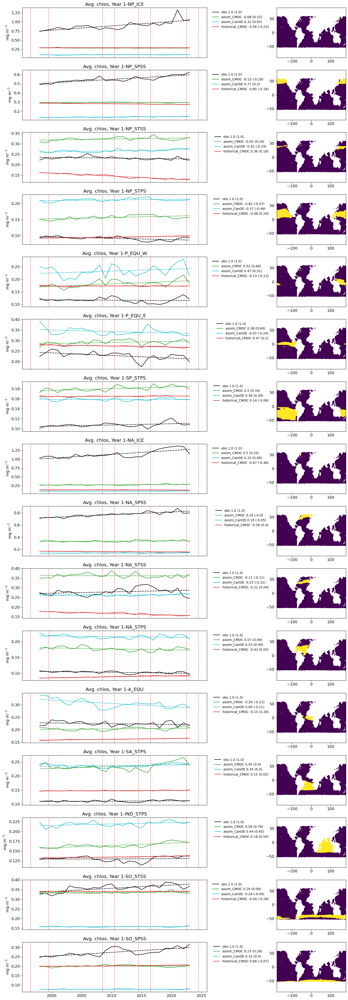

In [82]:
nldyr = 1 
for ildyr in np.arange(nldyr):
    file_out = f'ts_glb_total_at_{ildyr+1}-year_lead'
    title = f'Avg. chlos, Year {ildyr+1}'
    plot_ts_biomeavg_on_target([
                                   'obs',
                                   'assim_CMOC',
                                   'assim_CanOE',
                                   'historical_CMOC'
                                  ],
                                dict_em_ts_biomes,
                                bms_labels,
                                biomes = biomes.MeanBiomes * mask_ocean.where(mask_ocean>0), 
                                ldyr=ildyr,
                                figsize=(18,55),
                                bbox=(.85,.5,.5,.5),
                                title=title,
                                dir_name=dir_out,
                                file_name=file_out,
                                ylabel = units,
                                ENSO = True,
                                Correlations = True,
                                Trend  = True,
                                show=True,
                                save=False)        

Monthly mean time series per biome

JFM:[0, 1, 2]
AMJ:[3, 4, 5]
JAS:[6, 7, 8]
OND:[9, 10, 11]
ANN:[ 0  1  2  3  4  5  6  7  8  9 10 11]


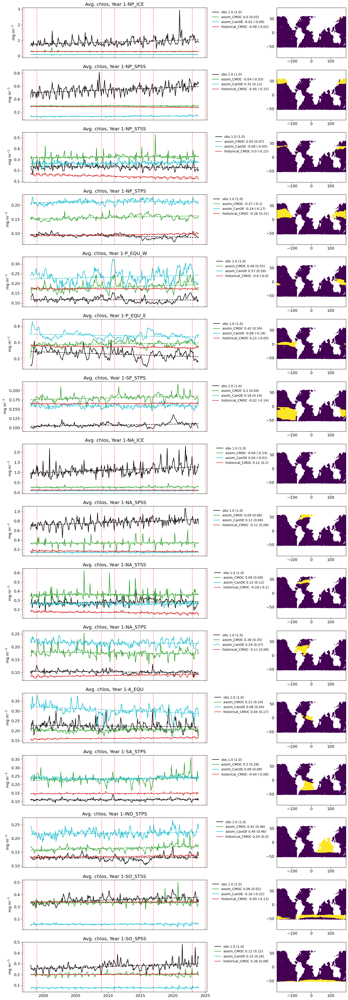

In [113]:
nldyr = 1 
for ildyr in np.arange(nldyr):
    file_out = f'ts_glb_total_at_{ildyr+1}-year_lead'
    title = f'Avg. chlos, Year {ildyr+1}'
    plot_ts_biomeavg_on_target([
                                   'obs',
                                   'assim_CMOC',
                                   'assim_CanOE',
                                   'historical_CMOC'
                                  ],
                                dict_em_anom_ts_biomes,
                                bms_labels,
                                biomes = biomes.MeanBiomes * mask_ocean.where(mask_ocean>0), 
                                ldyr=ildyr,
                                figsize=(18,55),
                                bbox=(.85,.5,.5,.5),
                                title=title,
                                dir_name=dir_out,
                                file_name=file_out,
                                ylabel = units,
                                ENSO = True,
                                monthly_res = True, 
                                Correlations = True,
                                Trend  = True,
                                show=True,
                                save=False)        

Seasonal mean time series per biome:

JFM:[0, 1, 2]
AMJ:[3, 4, 5]
JAS:[6, 7, 8]
OND:[9, 10, 11]
ANN:[ 0  1  2  3  4  5  6  7  8  9 10 11]


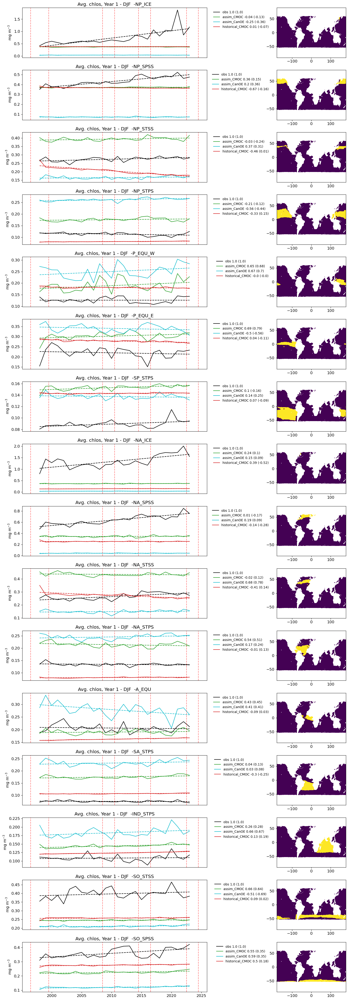

In [165]:

### by season

nldyr = 1 

for season in ['DJF']:
    file_out = f'ts_glb_total_at_{ildyr+1}-year_lead_{season}'
    title = f'Avg. chlos, Year {ildyr+1} - {season}  '
    plot_ts_biomeavg_on_target([
                                   'obs',
                                   'assim_CMOC',
                                   'assim_CanOE',
                                   'historical_CMOC'
                                  ],
                                dict_em_ts_biomes,
                                bms_labels,
                                biomes = biomes.MeanBiomes * mask_ocean.where(mask_ocean>0), 
                                ldyr=ildyr,
                                figsize=(18,55),
                                bbox=(.85,.5,.5,.5),
                                title=title, 
                                dir_name=dir_out,
                                file_name=file_out,
                                ylabel = units,
                                season = season,
                                Trend = True,
                                Correlations = True,
                                show=True,
                                save=False)        

In [ ]:
nldyr = 1 
ildyr = 0
for season in ['ANN']:
    file_out = f'ts_glb_total_at_{ildyr+1}-year_lead_{season}'
    title = f'Avg. chlos, Anoms Year {ildyr+1} - {season}  '
    plot_ts_biomeavg_on_target([
                                   'obs',
                                   'assim_CMOC',
                                   'assim_CanOE',
                                   'hindcast_CMOC',
                                   'historical_CMOC'
                                  ],
                                dict_em_anom_ts_biomes,
                                bms_labels,
                                biomes = biomes.MeanBiomes * mask_ocean.where(mask_ocean>0), 
                                ldyr=ildyr,
                                figsize=(10,45),
                                bbox=(.78,.5,.5,.5),
                                title=title,
                                dir_name=dir_out,
                                file_name=file_out,
                                annual_mean  =False,
                                ylabel = units,
                                season = season,
                                show=True,
                                save=False)        

# Maps #

Year 1 annual/seasonal mean over the entire time period:

init year starts: 1998
init year ends  : 2023
ave lead years  : 1 to 1


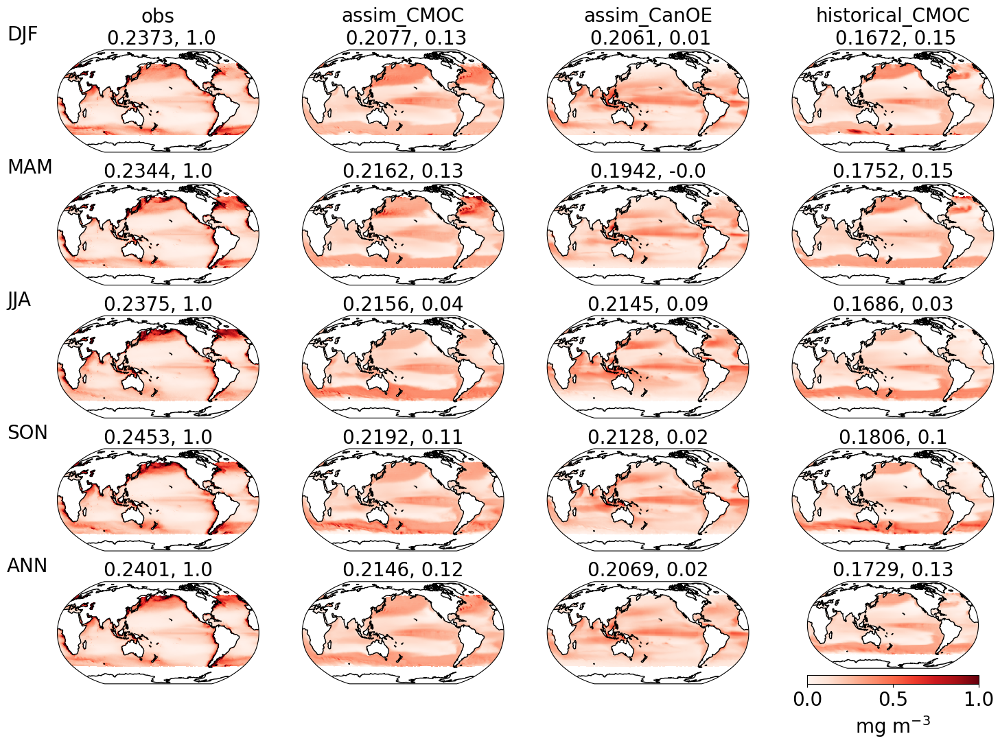

In [156]:
## Full field

show = True

dict_to_show = { 
                    'obs'    : ddata_em_after['obs'].sel(year=slice(y0_show,
                                                               y1_show)),
                    'assim_CMOC' : ddata_em_after['assim_CMOC'].sel(year=slice(y0_show,
                                                                  y1_show)),
                    'assim_CanOE' : ddata_em_after['assim_CanOE'].sel(year=slice(y0_show,
                                                                  y1_show)),
                    'historical_CMOC' : ddata_em_after['historical_CMOC'].sel(year=slice(y0_show,
                                                                  y1_show))
               }

ldyr_ini=1-1
ldyr_end=2-1
file_out = f'Maps_base_{y0_base}-{y1_base}_ldyr_{ldyr_ini}-{ldyr_end}_{y0_show}-{y1_show}'

if show:
    plot_composites([
                                   'obs',
                                   'assim_CMOC',
                                   'assim_CanOE',
                                   'historical_CMOC'
                ],
                dict_to_show,     
                figsize=(18,12),           
                central_longitude=-180,
                ldyr_ini=ldyr_ini,
                ldyr_end=ldyr_end,
                vmax=1,
                vmin=0,
                cmap = 'Reds',
                dir_name=dir_out,
                file_name=file_out,
                shifted_seasons = True,
                save=False,
                 mask = mask_ocean,
                 cbar_label = units)

Year 1 annual/seasonal std over the entire time period:

In [ ]:

### STD

show = True

dict_to_show = { 
                    'obs'    : dict_em_data['obs'].sel(year=slice(y0_show,
                                                               y1_show)),
                    'assim_CMOC' : dict_em_data['assim_CMOC'].sel(year=slice(y0_show,
                                                                  y1_show)),
                    'assim_CanOE' : dict_em_data['assim_CanOE'].sel(year=slice(y0_show,
                                                                  y1_show)),
                    'hindcast_CMOC' : dict_em_data['hindcast_CMOC'].sel(year=slice(y0_show,
                                                                  y1_show)),
                    'historical_CMOC' : dict_em_data['historical_CMOC'].sel(year=slice(y0_show,
                                                                  y1_show))
               }

ldyr_ini=1-1
ldyr_end=2-1
file_out = f'Maps_std_{y0_base}-{y1_base}_ldyr_{ldyr_ini}-{ldyr_end}_{y0_show}-{y1_show}'

if show:
    plot_composites([
                                   'obs',
                                   'assim_CMOC',
                                   'assim_CanOE',
                                   'hindcast_CMOC',
                                   'historical_CMOC'
                ],
                dict_to_show,     
                figsize=(18,12),           
                central_longitude=0,
                ldyr_ini=ldyr_ini,
                ldyr_end=ldyr_end,
                vmax=.25,
                vmin=-0.25,
                dir_name=dir_out,
                file_name=file_out,
                save=False,
                std = True,
                 mask = mask_ocean,
                 cbar_label = units)

Full field values per month averaged over the entire period:

In [ ]:
## Full field

show = True

dict_to_show = { 
                    'obs'    : ddata_em_after['obs'].sel(year=slice(y0_show,
                                                               y1_show)),
                    'assim_CMOC' : ddata_em_after['assim_CMOC'].sel(year=slice(y0_show,
                                                                  y1_show)),
                    'assim_CanOE' : ddata_em_after['assim_CanOE'].sel(year=slice(y0_show,
                                                                  y1_show)),                                                                  
                    'hindcast_CMOC' : ddata_em_after['hindcast_CMOC'].sel(year=slice(y0_show,
                                                                  y1_show)),
                    'historical_CMOC' : ddata_em_after['historical_CMOC'].sel(year=slice(y0_show,
                                                                  y1_show))
               }

ldyr_ini=1-1
ldyr_end=2-1
file_out = f'Maps_base_{y0_base}-{y1_base}_ldyr_{ldyr_ini}-{ldyr_end}_{y0_show}-{y1_show}'

if show:
    plot_composites([
                                   'obs',
                                   'assim_CMOC',
                                   'assim_CanOE',
                                   'hindcast_CMOC',
                                   'historical_CMOC'
                ],
                dict_to_show,     
                figsize=(18,30),           
                central_longitude=0,
                ldyr_ini=ldyr_ini,
                ldyr_end=ldyr_end,
                vmax=1,
                vmin=-1,
                dir_name=dir_out,
                file_name=file_out,
                individual_months=True,
                save=False,
                 mask = mask_ocean,
                 cbar_label = units)

Std across years per month over the entire period:

In [ ]:

### STD

show = True

dict_to_show = { 
                    'obs'    : dict_em_data['obs'].sel(year=slice(y0_show,
                                                               y1_show)),
                    'assim_CMOC' : dict_em_data['assim_CMOC'].sel(year=slice(y0_show,
                                                                  y1_show)),
                    'assim_CanOE' : dict_em_data['assim_CanOE'].sel(year=slice(y0_show,
                                                                  y1_show)),
                    'hindcast_CMOC' : dict_em_data['hindcast_CMOC'].sel(year=slice(y0_show,
                                                                  y1_show)),
                    'historical_CMOC' : dict_em_data['historical_CMOC'].sel(year=slice(y0_show,
                                                                  y1_show))
               }

ldyr_ini=1-1
ldyr_end=2-1
file_out = f'Maps_std_{y0_base}-{y1_base}_ldyr_{ldyr_ini}-{ldyr_end}_{y0_show}-{y1_show}'

if show:
    plot_composites([
                                   'obs',
                                   'assim_CMOC',
                                   'assim_CanOE',
                                   'hindcast_CMOC',
                                   'historical_CMOC'
                ],
                dict_to_show,     
                figsize=(18,30),           
                central_longitude=0,
                ldyr_ini=ldyr_ini,
                ldyr_end=ldyr_end,
                vmax=.25,
                vmin=-0.25,
                dir_name=dir_out,
                file_name=file_out,
                save=False,
                std = True,
                individual_months= True,
                 mask = mask_ocean,
                 cbar_label = units)

## Skill Measures ##

In [157]:

dict_plt_meas = { 
                  'corr' : { 'vmin' : -1.,
                             'vmax' : 1.,
                             'label': 'correlation',
                             'cmap' : 'RdBu_r'
                           },
                'corr_det' : { 'vmin' : -1.,
                             'vmax' : 1.,
                             'label': 'correlation',
                             'cmap' : 'RdBu_r'
                           },
                  'rmse' : { 'vmin' : 0,
                             'vmax' : 0.2,
                             'label': 'rmse (mg m$^{-3}$)',
                             'cmap' : 'Reds_r'
                           },
                  'bias' : { 'vmin' : -0.35,
                             'vmax' : 0.35,
                             'label': 'diff with obs (mg m$^{-3}$)',
                             'cmap' : 'RdBu_r'
                           },
                  'MSSS' : { 'vmin' : -100,
                             'vmax' : 1,
                             'label': 'MSSS',
                             'cmap' : 'Reds_r'
                           },
                }

dict_to_show = { 'full' : { 
                            'obs'    : dict_em_data['obs'].sel(year=slice(y0_show,
                                                                          y1_show)),
                            'assim_CMOC' : dict_em_data['assim_CMOC'].sel(year=slice(y0_show,
                                                                             y1_show)),
                            'assim_CanOE' : dict_em_data['assim_CanOE'].sel(year=slice(y0_show,
                                                                             y1_show)),
                            'hindcast_CMOC': dict_em_data['hindcast_CMOC'].sel(year=slice(y0_show,
                                                                            y1_show)),
                            'historical_CMOC' : dict_em_data['historical_CMOC'].sel(year=slice(y0_show,
                                                                             y1_show)),
                          },
                 'anom' : { 
                            'obs'    : dict_anom['obs'].sel(year=slice(y0_show,
                                                                       y1_show)),
                            'assim_CMOC' : dict_anom['assim_CMOC'].sel(year=slice(y0_show,
                                                                          y1_show)),
                            'assim_CanOE' : dict_anom['assim_CanOE'].sel(year=slice(y0_show,
                                                                          y1_show)),
                            'hindcast_CMOC' : dict_anom['hindcast_CMOC'].sel(year=slice(y0_show,
                                                                          y1_show)),
                            'historical_CMOC' : dict_anom['historical_CMOC'].sel(year=slice(y0_show,
                                                                          y1_show)),
                          },
               }



Correlation, detrended correlation, rmse, and bias vs observarion for year 1 over the entire period

Annual/seasonal mean:

init year starts: 1998
init year ends  : 2023
ave lead years  : 1 to 1


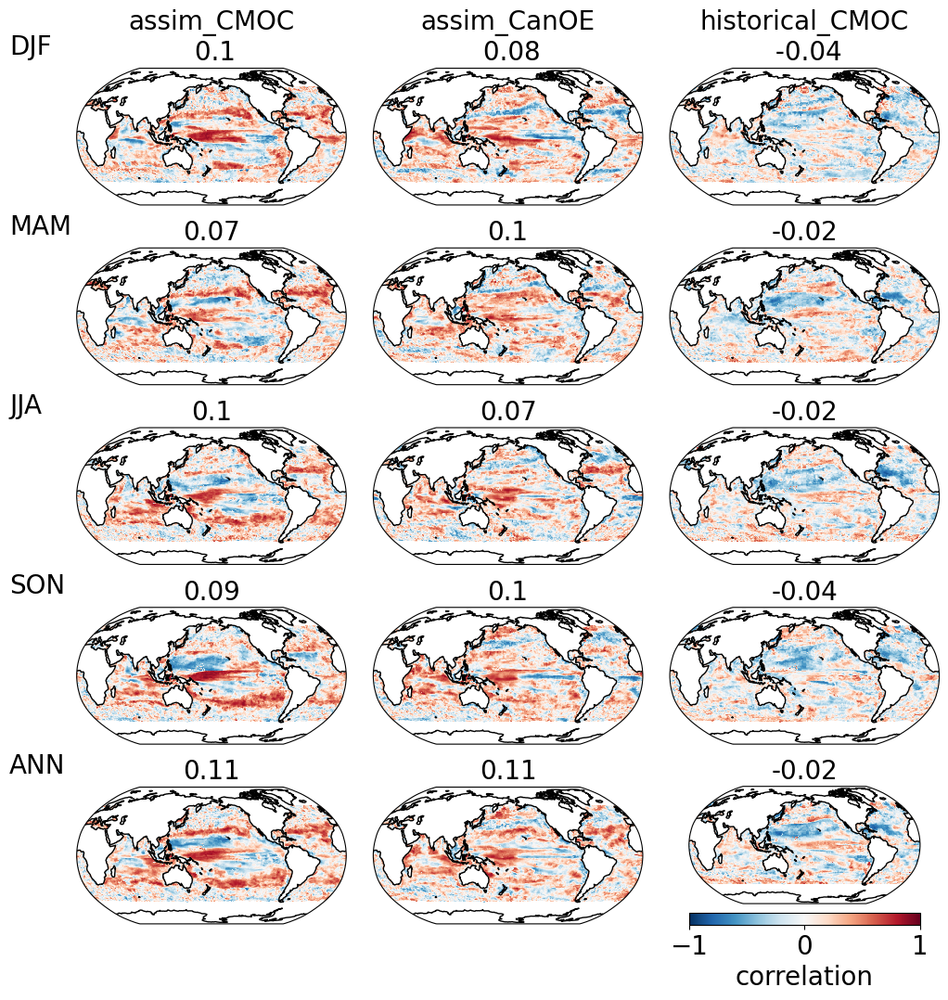

In [158]:
stype = 'full'

show = True


list_measures = [
                'corr',
                 ]

if show:
    for ind, measure in enumerate(list_measures):
        ldyr_ini=1-1
        ldyr_end=2-1
        file_out = f'Maps_{list_measures[ind]}_{stype}_ldyr_{ldyr_ini}-{ldyr_end}_{y0_show}-{y1_show}'
        plot_measures([
                                   'assim_CMOC',
                                   'assim_CanOE',
                                   'historical_CMOC'
                      ],
                    dict_to_show[stype],                
                    measure=measure,
                    central_longitude=-180,
                    ldyr_ini=ldyr_ini,
                    ldyr_end=ldyr_end,
                    vmin=dict_plt_meas[measure]['vmin'],
                    vmax=dict_plt_meas[measure]['vmax'],
                    label=dict_plt_meas[measure]['label'],
                    cmap=dict_plt_meas[measure]['cmap'],
                    dir_name=dir_out,
                    file_name=file_out,
                    shifted_seasons = True,
                    mask = mask_ocean,
                    save=False)    

Month specific:

In [ ]:
stype = 'full'

show = True


list_measures = [
                'corr',
                'corr_det',
                'rmse',
                'bias'
                 ]

if show:
    for ind, measure in enumerate(list_measures):
        ldyr_ini=1-1
        ldyr_end=2-1
        file_out = f'Maps_{list_measures[ind]}_{stype}_ldyr_{ldyr_ini}-{ldyr_end}_{y0_show}-{y1_show}'
        plot_measures([
                                   'assim_CMOC',
                                   'asm_CanOE_em',
                                   'hnd_em',
                                   'sim_em'
                      ],
                    dict_to_show[stype],                
                    measure=measure,
                    figsize=(12,28),  
                    central_longitude=0,
                    ldyr_ini=ldyr_ini,
                    ldyr_end=ldyr_end,
                    vmin=dict_plt_meas[measure]['vmin'],
                    vmax=dict_plt_meas[measure]['vmax'],
                    label=dict_plt_meas[measure]['label'],
                    cmap=dict_plt_meas[measure]['cmap'],
                    dir_name=dir_out,
                    individual_months=True,
                    file_name=file_out,
                    mask = mask_ocean,
                    save=False)    

# Skill per biome #

In [159]:
list_ds = [
           'obs',
            'hindcast_CMOC',
            'assim_CMOC',
            'assim_CanOE',
            'historical_CMOC'
           ]   
list_ds_type = [
               'full',
               ]

dict_am = {}
dict_am_measures = {}
for ds in list_ds:
    dict_am[ds] = {}
    dict_am_measures[ds] = {}
    for ds_type in list_ds_type:
        dict_am[ds][ds_type] = {} 

        data_ds_type = dict_em_data[ds] 
        dict_am[ds][ds_type] = write_monthly_to_annual(data_ds_type).sel(year=slice(y0_show,
                                                                                    y1_show))

        dict_am_measures[ds][ds_type] = {} 
        dict_am_measures[ds][ds_type]['corr'] = xr.corr(dict_am['obs'][ds_type],
                                                dict_am[ds][ds_type], dim = 'year')
        dict_am_measures[ds][ds_type]['rmse'] = rmse(dict_am['obs'][ds_type],
                                                dict_am[ds][ds_type])

In [56]:
ds_list = [
           'obs',
            'hindcast_CMOC',
            'assim_CMOC',
            'assim_CanOE',
            'historical_CMOC'
          ]

dict_meas_biomes = {}

for ii,bm_label in enumerate(bms_labels):

    dict_meas_biomes[bm_label] = {}

    biome = biomes.MeanBiomes.where(biomes.CoreBiomes == ii+1)
    biome =spatial_mask(biome.to_dataset()) * mask_ocean
    
    for ds_type in ['full']:
        
        dict_meas_biomes[bm_label][ds_type] = {} 

        for ds_meas in ['corr','rmse']:
            
            dict_meas_biomes[bm_label][ds_type][ds_meas] = {} 
                
            for ds in ds_list:
                
                dict_meas_biomes[bm_label][ds_type][ds_meas][ds] = {} 
        
                values = area_weighted_avg(dict_am_measures[ds][ds_type][ds_meas],
                                          mask=biome).values
                
                dict_meas_biomes[bm_label][ds_type][ds_meas][ds] = values

In [160]:
dict_plot_meas = { 'rmse'         : { 
                                      'title'     : '(a)',
                                      'ylabel'    : f'RMSE', # ({units})',
                                      'bbox'      : (.49,.5,.5,.5),
                                      'ylim_min'  : 0.,
                                      'ylim_max'  : 2.3,
                                      'show_leg'  : False,
                                      'show_hline': False    
                                    },                 
                   'corr'         : {
                                      'title'     : '(b)',
                                      'ylabel'    : 'ACC',
                                      'ylim_min'  : -.19,
                                      'ylim_max'  : .8,
                                      'bbox'      : (.06,.5,.5,.5),
                                      'show_leg'  : False,
                                      'show_hline': True   
                                    },
                 }

Biome average of annual mean skills for year 1:

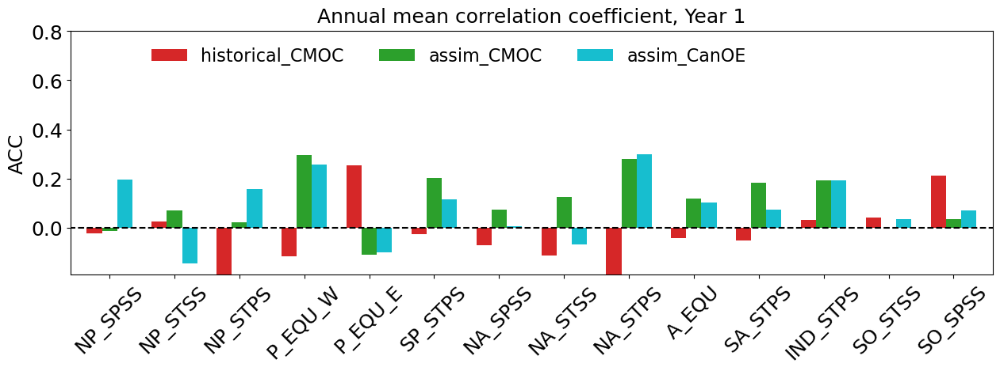

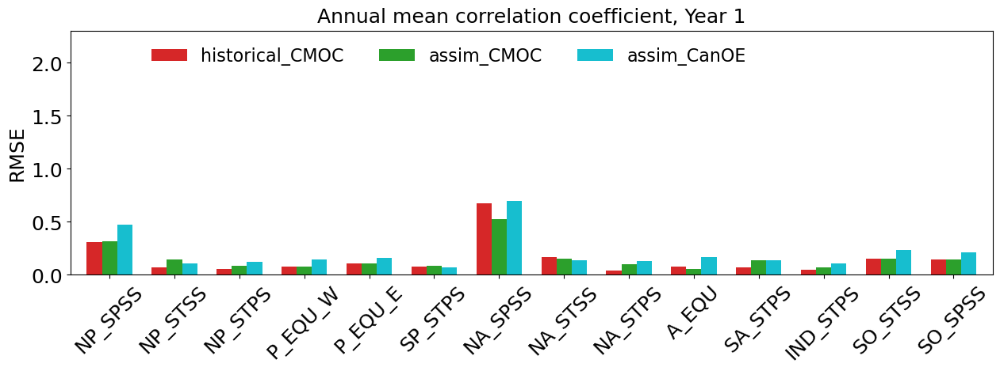

In [60]:
ds_list = ['assim_CanOE',
            'assim_CMOC',
            'historical_CMOC',
            
          ]

ds_type = 'full'
nld = 1

for meas in [
             'corr',
             'rmse'
            ]:

    dict_data_to_plot = {}
    for ild in np.arange(nld):
        dict_data_to_plot[ild] = {}
        for ds in reversed(ds_list):
            dict_data_to_plot[ild][ds] = {}
            for bm_label in bms_labels:
              if 'ICE' not in bm_label:
                dict_data_to_plot[ild][ds][bm_label] = {}
                dict_data_to_plot[ild][ds][bm_label] = dict_meas_biomes[bm_label][ds_type][meas][ds][ild]

    for ild in np.arange(nld):
        
        # file_out = f'Barplots_biomes_{meas}_year-{ild+1}_{nadj_name}'
        plot_bars(dict_data_to_plot[ild],
                  title=f'Annual mean correlation coefficient, Year {ild+1}',
                  ylabel=dict_plot_meas[meas]['ylabel'],
                  ylim=(dict_plot_meas[meas]['ylim_min'],
                        dict_plot_meas[meas]['ylim_max']),
                  show_hline=dict_plot_meas[meas]['show_hline'],
                  color_dict = dict_color,
                  ncol=3,
                  figsize=(15, 4),
                  leg=True,
                  dir_name=dir_out,
                #   file_name=file_out,
                  show=True,
                  save=False)            

In [59]:
list_ds = [
           'obs',
            'hindcast_CMOC',
            'assim_CMOC',
            'assim_CanOE',
            'historical_CMOC'
           ]   
list_ds_type = [
               'full',
               ]


dict_am_measures_seasons = {}
for season in ['JFM','AMJ','JAS', 'OND', 'ANN']:
    dict_am = {}
    dict_am_measures = {}
    for ds in list_ds:
        dict_am[ds] = {}
        dict_am_measures[ds] = {}
        for ds_type in list_ds_type:
            dict_am[ds][ds_type] = {} 

            data_ds_type = dict_em_data[ds] 
            dict_am[ds][ds_type] = write_monthly_to_annual(data_ds_type, season = season).sel(year=slice(y0_show,
                                                                                        y1_show))

            dict_am_measures[ds][ds_type] = {} 
            dict_am_measures[ds][ds_type]['corr'] = xr.corr(dict_am['obs'][ds_type],
                                                    dict_am[ds][ds_type], dim = 'year')
            dict_am_measures[ds][ds_type]['rmse'] = rmse(dict_am['obs'][ds_type],
                                                    dict_am[ds][ds_type])
    dict_am_measures_seasons[season] = dict_am_measures

In [60]:

ds_list = [
           'obs',
            'hindcast_CMOC',
            'assim_CMOC',
            'assim_CanOE',
            'historical_CMOC'
          ]

dict_meas_biomes_seasons = {}
for season in ['JFM','AMJ','JAS', 'OND']:
    dict_meas_biomes = {}

    for ii,bm_label in enumerate(bms_labels):

        dict_meas_biomes[bm_label] = {}

        biome = biomes.MeanBiomes.where(biomes.CoreBiomes == ii+1)
        biome =spatial_mask(biome.to_dataset()) * mask_ocean
        
        for ds_type in ['full']:
            
            dict_meas_biomes[bm_label][ds_type] = {} 

            for ds_meas in ['corr','rmse']:
                
                dict_meas_biomes[bm_label][ds_type][ds_meas] = {} 
                    
                for ds in ds_list:
                    
                    dict_meas_biomes[bm_label][ds_type][ds_meas][ds] = {} 
            
                    values = area_weighted_avg(dict_am_measures_seasons[season][ds][ds_type][ds_meas],
                                            mask=biome).values
                    
                    dict_meas_biomes[bm_label][ds_type][ds_meas][ds] = values
    dict_meas_biomes_seasons[season] = dict_meas_biomes

Biome average of seasonal mean skills for year 1:

In [ ]:
ds_list = [
            'hnd_em',
            'assim_CMOC',
            'assim_CanOE',
            'historical_CMOC'
          ]

ds_type = 'full'
nld = 1
for season in ['JFM','AMJ','JAS', 'OND']:
    for meas in [
                'corr',
                'rmse'
                ]:

        dict_data_to_plot = {}
        for ild in np.arange(nld):
            dict_data_to_plot[ild] = {}
            for ds in ds_list:
                dict_data_to_plot[ild][ds] = {}
                for bm_label in bms_labels:
                    dict_data_to_plot[ild][ds][bm_label] = {}
                    dict_data_to_plot[ild][ds][bm_label] = dict_meas_biomes_seasons[season][bm_label][ds_type][meas][ds][ild]

        for ild in np.arange(nld):
            
            # file_out = f'Barplots_biomes_{meas}_year-{ild+1}_{nadj_name}'
            plot_bars(dict_data_to_plot[ild],
                    title=f'Forecast skill per biome, Year {ild+1} - {season}',
                    ylabel=dict_plot_meas[meas]['ylabel'],
                    ylim=(dict_plot_meas[meas]['ylim_min'],
                            dict_plot_meas[meas]['ylim_max']),
                    show_hline=dict_plot_meas[meas]['show_hline'],
                    ncol=3,
                    figsize=(15, 4),
                    leg=True,
                    dir_name=dir_out,
                    #   file_name=file_out,
                    show=True,
                    save=False)            

Global mean of skills per lead time:

In [62]:
ds_list = [
           'obs',
            'hindcast_CMOC',
            'assim_CMOC',
             'assim_CanOE',
            'historical_CMOC'
          ]

dict_meas_seasons = {}
for season in ['JFM', 'AMJ', 'JAS', 'OND', 'ANN']:
    dict_meas = {}
    for ds_type in ['full']:
        
        dict_meas[ds_type] = {} 

        for ds_meas in ['corr','rmse']:
            
            dict_meas[ds_type][ds_meas] = {} 
                
            for ds in ds_list:
                
                dict_meas[ds_type][ds_meas][ds] = {} 
        
                values = area_weighted_avg(dict_am_measures_seasons[season][ds][ds_type][ds_meas],
                                            mask=mask_ocean).values
                
                dict_meas[ds_type][ds_meas][ds] = values
    dict_meas_seasons[season] = dict_meas

In [ ]:
### Skill with lead time of prediction
meas = 'corr'
ds_type = 'full'

 
plt.figure(figsize = (12,15))

for ind, season in enumerate(['ANN', 'JFM','AMJ','JAS', 'OND']):
   
        plt.subplot(3,2,ind + 1)
        ds_to_plot = dict_meas_seasons[season][ds_type][meas]['hindcast_CMOC']
        plt.scatter(np.arange(5), ds_to_plot, label = 'hindcast_CMOC')
        ds_to_plot = dict_meas_seasons[season][ds_type][meas]['assim_CMOC']
        plt.hlines(ds_to_plot[0],-0.3, 4.3, color = 'darkorange', label = 'assim_CMOC')  
        ds_to_plot = dict_meas_seasons[season][ds_type][meas]['assim_CanOE']
        plt.hlines(ds_to_plot[0],-0.3, 4.3, color = 'cyan', label = 'assim_CanOE') 
        ds_to_plot = dict_meas_seasons[season][ds_type][meas]['sim_em']
        plt.hlines(ds_to_plot[0],-0.3, 4.3, color = 'green',  label = 'sim_em')
        plt.hlines(0,-0.3, 4.3, color = 'k',linestyle = 'dotted', alpha = 0.5)   
        plt.xlabel('lead_year')
        plt.ylabel('ACC')
        plt.title(f'{season} mean - {y0_show}-{y1_show} - {ds_type}')
        plt.ylim([-0.05, 0.2])
        
        plt.xlim([-0.3, 4.3])
        plt.xticks(np.arange(5), np.arange(1,6))
        plt.legend( loc='center right')
  

In [ ]:
### Skill with lead time of prediction

meas = 'rmse'
ds_type = 'full'

ds_list = [
           'obs',
            'hindcast_CMOC',
            'assim_CMOC',
            'assim_CanOE',
            'historical_CMOC'
          ]
 
plt.figure(figsize = (12,15))

for ind, season in enumerate(['ANN', 'JFM','AMJ','JAS', 'OND']):
   
        plt.subplot(3,2,ind + 1)
        ds_to_plot = dict_meas_seasons[season][ds_type][meas]['hindcast_CMOC']
        plt.scatter(np.arange(5), ds_to_plot, label = 'hindcast_CMOC')
        ds_to_plot = dict_meas_seasons[season][ds_type][meas]['assim_CMOC']
        plt.hlines(ds_to_plot[0],-0.3, 4.3, color = 'darkorange', label = 'assim_CMOC')  
        ds_to_plot = dict_meas_seasons[season][ds_type][meas]['assim_CanOE']
        plt.hlines(ds_to_plot[0],-0.3, 4.3, color = 'cyan', label = 'assim_CanOE') 
        ds_to_plot = dict_meas_seasons[season][ds_type][meas]['sim_em']
        plt.hlines(ds_to_plot[0],-0.3, 4.3, color = 'green',  label = 'sim_em')
        plt.xlabel('lead_year')
        plt.ylabel('RMSE')
        plt.title(f'{season} mean - {y0_show}-{y1_show} - {ds_type}')
        plt.ylim([0.1, 0.2])
        plt.xlim([-0.3, 4.3])
        plt.xticks(np.arange(5), np.arange(1,6))
        plt.legend( loc='center right')
  

Biome skills based on month

In [67]:
list_ds = [
           'obs',
            'hindcast_CMOC',
            'assim_CMOC',
            'assim_CanOE',
            'historical_CMOC'
           ]   
list_ds_type = [
               'full',
               ]


dict_am_measures_seasons = {}
for season in ['Jan','Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']:
    dict_am = {}
    dict_am_measures = {}
    for ds in list_ds:
        dict_am[ds] = {}
        dict_am_measures[ds] = {}
        for ds_type in list_ds_type:
            dict_am[ds][ds_type] = {} 

            data_ds_type = dict_em_data[ds] 
            dict_am[ds][ds_type] = write_monthly_to_annual(data_ds_type, season = season).sel(year=slice(y0_show,
                                                                                        y1_show))

            dict_am_measures[ds][ds_type] = {} 
            dict_am_measures[ds][ds_type]['corr'] = xr.corr(dict_am['obs'][ds_type],
                                                    dict_am[ds][ds_type], dim = 'year')
            dict_am_measures[ds][ds_type]['rmse'] = rmse(dict_am['obs'][ds_type],
                                                    dict_am[ds][ds_type])
    dict_am_measures_seasons[season] = dict_am_measures

ds_list = [
           'obs',
            'hindcast_CMOC',
            'assim_CMOC',
            'assim_CanOE',
            'historical_CMOC'
          ]

dict_meas_biomes_seasons = {}
for season in ['Jan','Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']:
    dict_meas_biomes = {}

    for ii,bm_label in enumerate(bms_labels):

        dict_meas_biomes[bm_label] = {}

        biome = biomes.MeanBiomes.where(biomes.CoreBiomes == ii+1)
        biome =spatial_mask(biome.to_dataset()) * mask_ocean
        
        for ds_type in ['full']:
            
            dict_meas_biomes[bm_label][ds_type] = {} 

            for ds_meas in ['corr','rmse']:
                
                dict_meas_biomes[bm_label][ds_type][ds_meas] = {} 
                    
                for ds in ds_list:
                    
                    dict_meas_biomes[bm_label][ds_type][ds_meas][ds] = {} 
            
                    values = area_weighted_avg(dict_am_measures_seasons[season][ds][ds_type][ds_meas],
                                            mask=biome).values
                    
                    dict_meas_biomes[bm_label][ds_type][ds_meas][ds] = values
    dict_meas_biomes_seasons[season] = dict_meas_biomes

In [ ]:
ds_list = [
            'hindcast_CMOC',
            'assim_CMOC',
            'assim_CanOE',
            'historical_CMOC'
          ]

ds_type = 'full'
nld = 1
for season in ['Jan','Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']:
    for meas in [
                'corr',
                'rmse'
                ]:

        dict_data_to_plot = {}
        for ild in np.arange(nld):
            dict_data_to_plot[ild] = {}
            for ds in ds_list:
                dict_data_to_plot[ild][ds] = {}
                for bm_label in bms_labels:
                    dict_data_to_plot[ild][ds][bm_label] = {}
                    dict_data_to_plot[ild][ds][bm_label] = dict_meas_biomes_seasons[season][bm_label][ds_type][meas][ds][ild]

        for ild in np.arange(nld):
            
            # file_out = f'Barplots_biomes_{meas}_year-{ild+1}_{nadj_name}'
            plot_bars(dict_data_to_plot[ild],
                    title=f'Forecast skill per biome, Year {ild+1} - {season}',
                    ylabel=dict_plot_meas[meas]['ylabel'],
                    ylim=(dict_plot_meas[meas]['ylim_min'],
                            dict_plot_meas[meas]['ylim_max']),
                    show_hline=dict_plot_meas[meas]['show_hline'],
                    ncol=3,
                    figsize=(15, 4),
                    leg=True,
                    dir_name=dir_out,
                    #   file_name=file_out,
                    show=True,
                    save=False)            

In [267]:
# def plot_lead_time_skill(data_dict,
#                          bms_labels,
#                          ds_list,
#                          meas = 'corr',
#                          fig_size = (12,6),
#                         ylim=(-.5,1),
#                         fontsize=18,
#                         bbox=(0,0.75,.5,.5),
#                          save = False,
#                         dir_name=None,
#                         file_name=None):
    
#     color = {'assim_CMOC' : 'darkorange','historical_CMOC' : 'green'}

#     plt.figure(figsize=(12,6))
#     for i in range(len(bms_labels)):
#         legend_elements = []
#         for ds in ds_list: 
#             if ds in [  'assim_CMOC','historical_CMOC']:
#                 ds_plot = dict_data_to_plot[meas][ds].sel(lead_year = slice(1,1))  
#                 plt.scatter(i * np.ones(len(ds_plot.lead_year)) + 0.15, ds_plot.isel(biome = i), c = color[ds])
#                 if i==0:
#                     legend_elements.append( Line2D([0], [0], marker='o', color=color[ds], label=ds,markerfacecolor=color[ds]))

#             else:
#                 ds_plot = dict_data_to_plot[meas][ds]
#                 plt.scatter(i * np.ones(len(ds_plot.lead_year)) - 0.15, ds_plot.isel(biome = i), c = ds_plot.lead_year,edgecolors= 'k' , cmap = 'Blues_r')
#                 if i==0:
#                     cbar = plt.colorbar()
#                     cbar.set_label('lead_year', fontsize = fontsize)
#                     cbar.set_ticks( np.arange(1, len(ds_plot.lead_year) + 1 ).astype('int') , fontsize = fontsize - 2)
#             if i == 0:
#                 plt.legend(handles=legend_elements, loc='best',
#                         bbox_to_anchor=bbox,
#                       fontsize=fontsize-2)  
#             plt.vlines(i + 0.55, ylim[0],ylim[1], linestyles='dashed', color = 'k')

#     plt.xticks(np.arange(len(bms_labels)), bms_labels, rotation = 45, fontsize = fontsize - 5)
#     plt.ylabel(meas, fontsize = fontsize)
#     plt.yticks(fontsize = fontsize - 2)
#     plt.xlabel('Biomes', fontsize = fontsize - 2)

In [ ]:
# from matplotlib.lines import Line2D
# ds_list = [
#             'hnd_em',
#             'assim_CMOC',
#             'historical_CMOC'
#           ]

# ds_type = 'full'
# nld = 5


# dict_data_to_plot = {}
# for meas in [
#              'corr',
#              'rmse'
#             ]:

#     dict_data_to_plot[meas] = {}
#     for ds in ds_list:
#         dict_data_to_plot[meas][ds] = xr.concat( [xr.DataArray(dict_meas_biomes[bm][ds_type][meas][ds][None,], dims = ['biome' , 'lead_year'], coords = {'lead_year' : np.arange(1,nld+1), 'biome' : [bm]}) for bm in bms_labels],dim = 'biome')

# meas = 'corr'
# plot_lead_time_skill(dict_data_to_plot, bms_labels, ds_list, meas  = meas)


# ENSO maps

init year starts: 1998
init year ends  : 2023
ave lead years  : 1 to 1
init year starts: 1998
init year ends  : 2023
ave lead years  : 1 to 1
init year starts: 1998
init year ends  : 2023
ave lead years  : 1 to 1
init year starts: 1998
init year ends  : 2023
ave lead years  : 1 to 1
init year starts: 1998
init year ends  : 2023
ave lead years  : 1 to 1


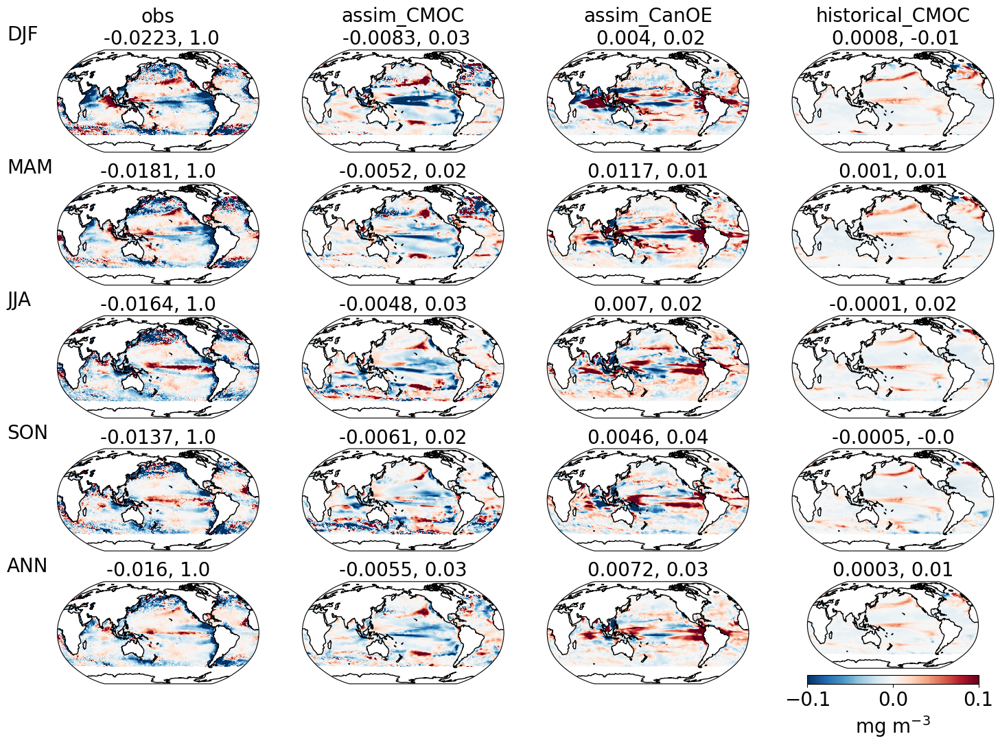

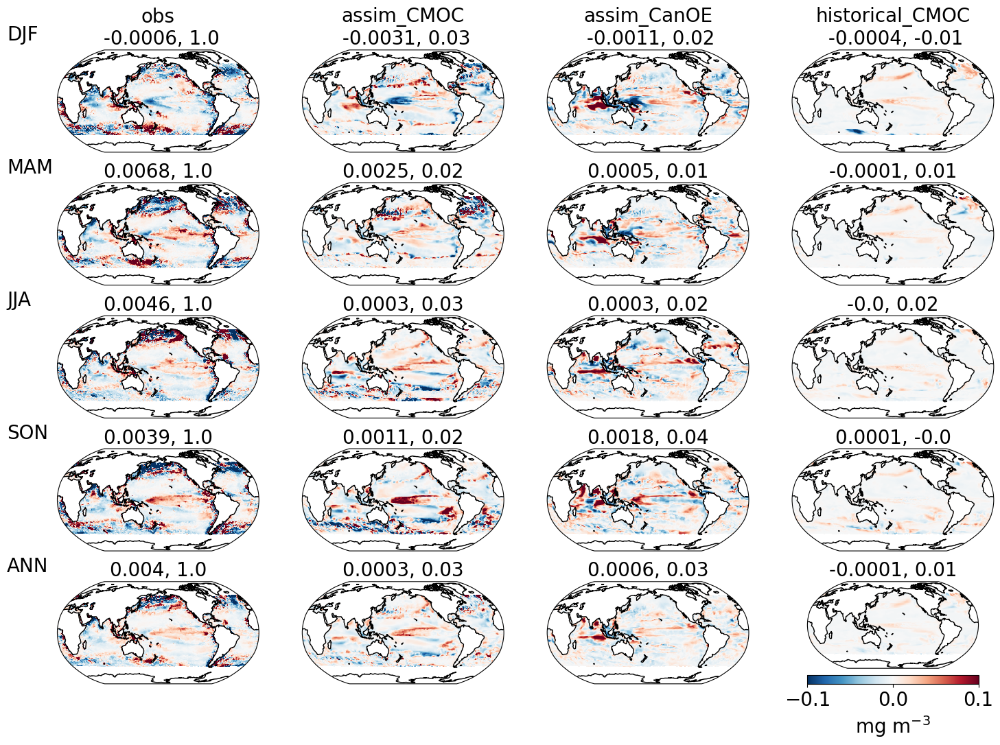

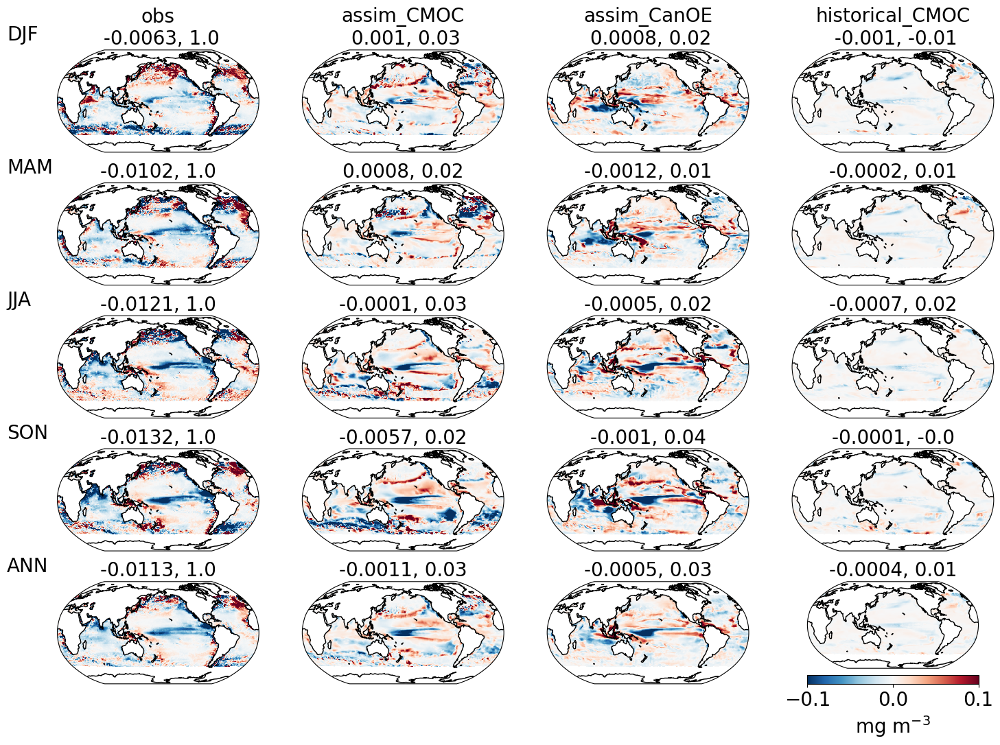

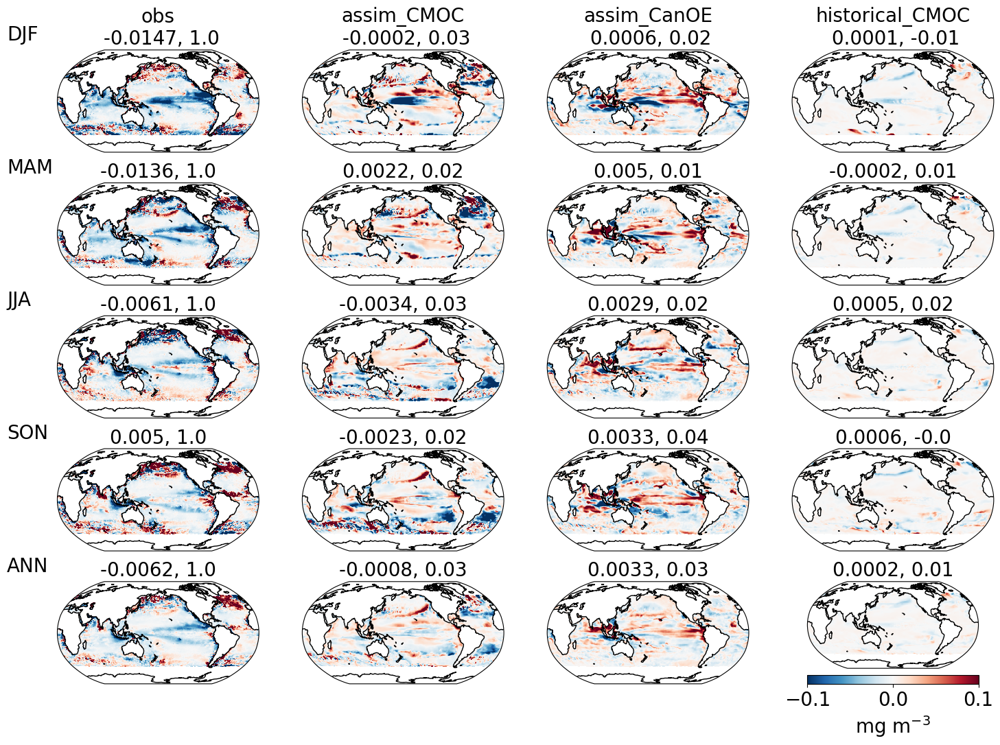

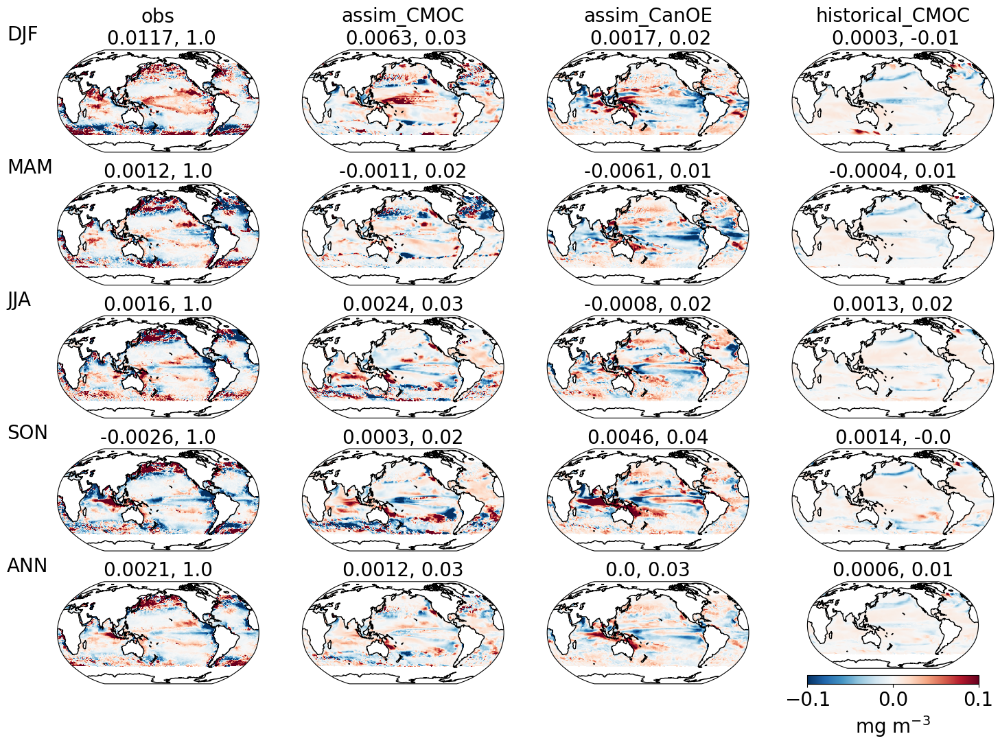

In [166]:
years = [1998, 2007, 2015,2016,2023]
ldyr_ini=1-1
ldyr_end=2-1

dict_to_show = { 
                    'obs'    : dict_anom['obs'].sel(year=slice(y0_show,
                                                               y1_show)),
                    'assim_CMOC' : dict_anom['assim_CMOC'].sel(year=slice(y0_show,
                                                                  y1_show)),
                    'assim_CanOE' : dict_anom['assim_CanOE'].sel(year=slice(y0_show,
                                                                  y1_show)),
                    'historical_CMOC' : dict_anom['historical_CMOC'].sel(year=slice(y0_show,
                                                                  y1_show))
               }

for year in years:

    plot_composites([
                                    'obs',
                                    'assim_CMOC',
                                    'assim_CanOE',
                                    'historical_CMOC'
                    ],
                    dict_to_show,     
                    figsize=(18,12),   
                    specific_years = [year] ,       
                    central_longitude=-180,
                    ldyr_ini=ldyr_ini,
                    ldyr_end=ldyr_end,
                    vmax=0.1,
                    vmin=-0.1,
                    dir_name=dir_out,
                    file_name=None,
                    shifted_seasons = True,
                    save=False,
                    mask = mask_ocean,
                    cbar_label = units)

In [70]:

dict_clim_mean_removed = {
               'obs' : get_climatology_on_base(dict_em_data['obs'],
                                               y0_base,
                                               y1_base,
                                               ltime_dep=False,  # already aligned to target
                                               full_set=False,
                                               remove_mean = True),  # already aligned to target
               'assim_CMOC' : get_climatology_on_base(dict_em_data['assim_CMOC'],
                                               y0_base,
                                               y1_base,
                                               ltime_dep=False,  # already aligned to target
                                               full_set=False,
                                               remove_mean = True),  # already aligned to target
               'assim_CanOE' : get_climatology_on_base(dict_em_data['assim_CanOE'],
                                               y0_base,
                                               y1_base,
                                               ltime_dep=False,  # already aligned to target
                                               full_set=False,
                                               remove_mean = True),  # already aligned to target                                               
               'hindcast_CMOC': get_climatology_on_base(dict_em_data['hindcast_CMOC'],
                                               y0_base,
                                               y1_base,
                                               ltime_dep=False,  # already aligned to target
                                               full_set=False,
                                               remove_mean = True),  # already aligned to target
               'historical_CMOC': get_climatology_on_base(dict_em_data['historical_CMOC'],
                                               y0_base,
                                               y1_base,
                                               ltime_dep=False,  # already aligned to target
                                               full_set=False,
                                               remove_mean = True),  # already aligned to target
            }


dict_anom_mean_clim_removed = {
                  'obs'    : dict_em_data['obs']    - dict_clim_mean_removed['obs'],
                  'assim_CMOC' : dict_em_data['assim_CMOC'] - dict_clim_mean_removed['assim_CMOC'],
                  'assim_CanOE' : dict_em_data['assim_CanOE'] - dict_clim_mean_removed['assim_CanOE'],
                  'hindcast_CMOC' : dict_em_data['hindcast_CMOC'] - dict_clim_mean_removed['hindcast_CMOC'],
                  'historical_CMOC' : dict_em_data['historical_CMOC'] - dict_clim_mean_removed['historical_CMOC'], 
             }

dict_to_show = { 
                    'obs'    : dict_anom_mean_clim_removed['obs'].sel(year=slice(y0_show,
                                                               2020)),
                    'assim_CMOC' : dict_anom_mean_clim_removed['assim_CMOC'].sel(year=slice(y0_show,
                                                                  2020)),
                    'assim_CanOE' : dict_anom_mean_clim_removed['assim_CanOE'].sel(year=slice(y0_show,
                                                                  2020)),
                    'hindcast_CMOC' : dict_anom_mean_clim_removed['hindcast_CMOC'].sel(year=slice(y0_show,
                                                                  2020)),
                    # 'historical_CMOC' : dict_anom['historical_CMOC'].sel(year=slice(y0_show,
                    #                                               2020))
               }


ONI_assm = xr.open_dataset('/home/rpg002/BGC_skill/00_diagnostics_basics/CanESM5_assim_ONI_1975-2020.nc')['tos']
ONI_obs = xr.open_dataset('/home/rpg002/BGC_skill/00_diagnostics_basics/ERSST_v5_ONI_1915-2021.nc')['tos']

ONI_obs = ONI_obs.sel(year=slice(y0_show,2020))
ONI_assm = ONI_assm.sel(year=slice(y0_show,2020))

                                       

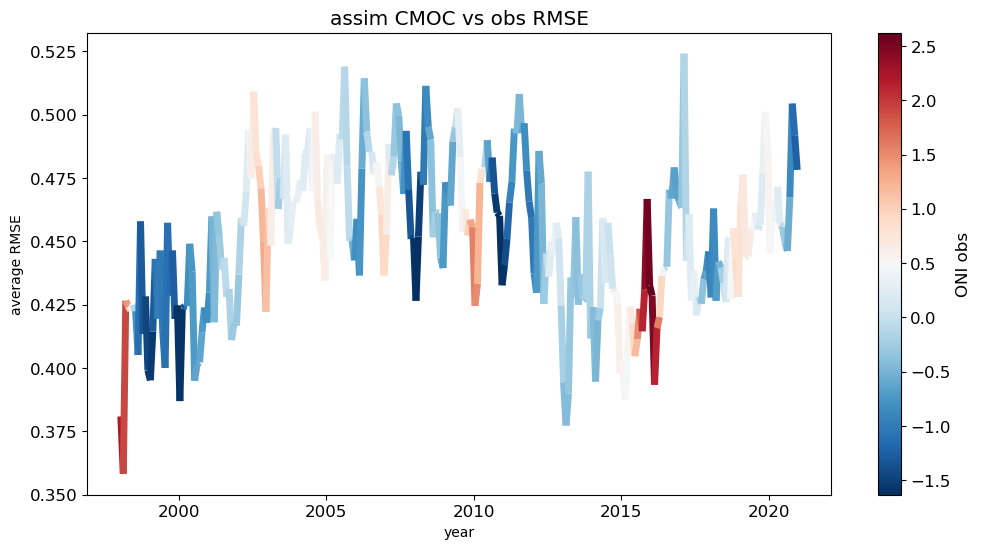

In [71]:
from matplotlib.collections import LineCollection
from matplotlib.colors import ListedColormap, BoundaryNorm

rmse = np.sqrt(area_weighted_avg((dict_to_show['assim_CMOC'] - dict_to_show['obs'])**2, mask=mask_ocean))[:,:12]
rmse = rmse.stack(ref = ('year','time')).assign_coords(ref = rmse.stack(ref = ('year','time')).year + (rmse.stack(ref = ('year','time')).time + 0.5) /12)
ONI = ONI_obs.stack(ref = ('year','time')).assign_coords(ref = ONI_obs.stack(ref = ('year','time')).year + (ONI_obs.stack(ref = ('year','time')).time + 0.5) /12)

x = rmse.ref 
y = rmse
z = ONI

points = np.array([x, y]).T.reshape(-1, 1, 2)
segments = np.concatenate([points[:-1], points[1:]], axis=1)


fig, ax = plt.subplots(figsize =(12,6))

# Create a continuous norm to map from data points to colors
norm = plt.Normalize(z.min(), z.max())
lc = LineCollection(segments, cmap='RdBu_r', norm=norm)
lc.set_array(z)
lc.set_linewidth(5)
ax.add_collection(lc)

ax.autoscale()
fig.colorbar( lc, ax= ax, label='ONI obs')
ax.set_xlabel('year', size = 10)
ax.set_ylabel('average RMSE', size = 10)
ax.set_title('assim CMOC vs obs RMSE')


plt.sci(lc)
plt.show()

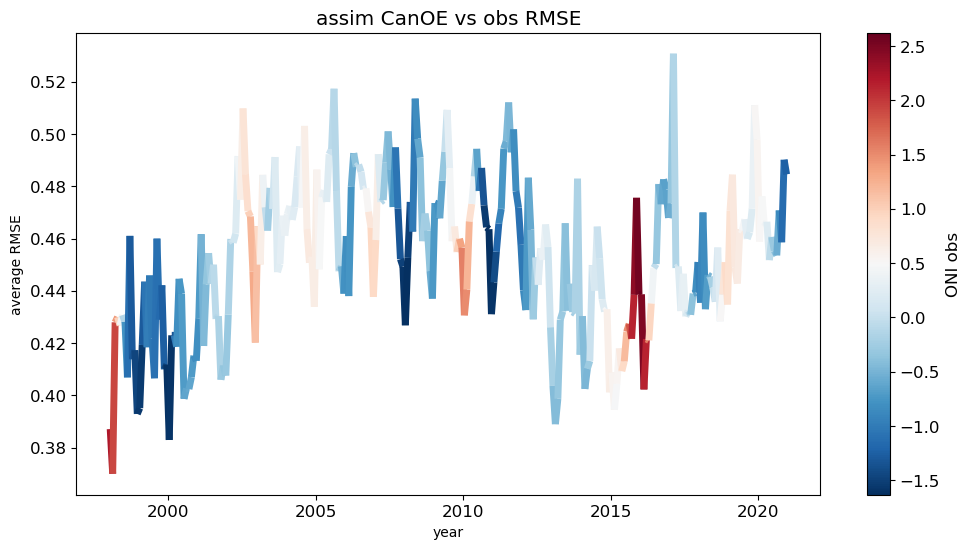

In [72]:
from matplotlib.collections import LineCollection
from matplotlib.colors import ListedColormap, BoundaryNorm

rmse = np.sqrt(area_weighted_avg((dict_to_show['assim_CanOE'] - dict_to_show['obs'])**2, mask=mask_ocean))[:,:12]
rmse = rmse.stack(ref = ('year','time')).assign_coords(ref = rmse.stack(ref = ('year','time')).year + (rmse.stack(ref = ('year','time')).time + 0.5) /12)
ONI = ONI_obs.stack(ref = ('year','time')).assign_coords(ref = ONI_obs.stack(ref = ('year','time')).year + (ONI_obs.stack(ref = ('year','time')).time + 0.5) /12)

x = rmse.ref 
y = rmse
z = ONI

points = np.array([x, y]).T.reshape(-1, 1, 2)
segments = np.concatenate([points[:-1], points[1:]], axis=1)


fig, ax = plt.subplots(figsize =(12,6))

# Create a continuous norm to map from data points to colors
norm = plt.Normalize(z.min(), z.max())
lc = LineCollection(segments, cmap='RdBu_r', norm=norm)
lc.set_array(z)
lc.set_linewidth(5)
ax.add_collection(lc)

ax.autoscale()
fig.colorbar( lc, ax= ax, label='ONI obs')
ax.set_xlabel('year', size = 10)
ax.set_ylabel('average RMSE', size = 10)
ax.set_title('assim CanOE vs obs RMSE')


plt.sci(lc)
plt.show()

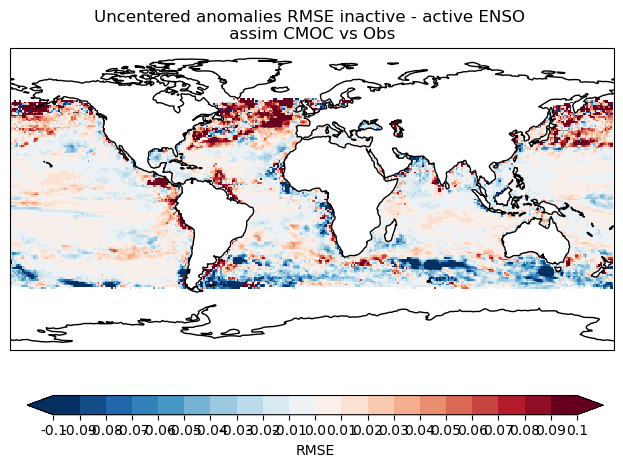

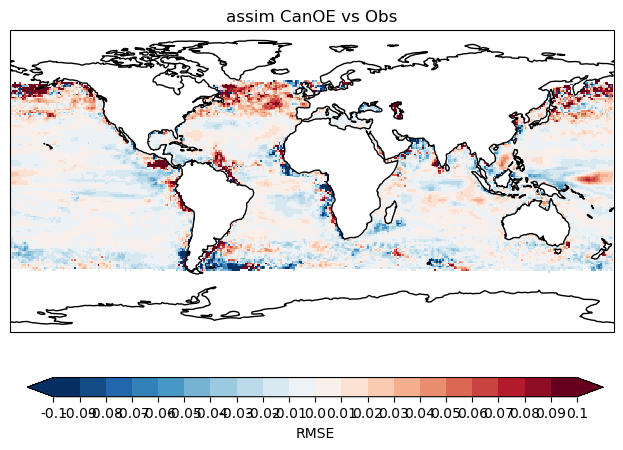

In [75]:
time_coords = ONI_obs.stack(ref = ('year','time')).year + (ONI_obs.stack(ref = ('year','time')).time + 0.5) /12
ONI_obs_stacked = ONI_obs.stack(ref = ('year','time')).assign_coords(ref = time_coords.values)
ONI_active = ONI_obs_stacked.where((ONI_obs_stacked <= np.quantile(ONI_obs,0.25)) | (ONI_obs_stacked >= np.quantile(ONI_obs,0.75)), drop = True)
ONI_inactive = ONI_obs_stacked.where((ONI_obs_stacked > np.quantile(ONI_obs,0.25)) & (ONI_obs_stacked < np.quantile(ONI_obs,0.75)), drop = True)

se = ((dict_to_show['assim_CMOC'] - dict_to_show['obs'])**2)[:,:12]
se = se.stack(ref = ('year','time')).assign_coords(ref = time_coords.values)

se_inactive = se.sel(ref = ONI_inactive.ref)
se_active = se.sel(ref = ONI_active.ref)

dstp = np.sqrt(se_inactive.mean('ref')) - np.sqrt(se_active.mean('ref'))

plot_single_map_wmo(dstp,lat=dstp.lat,lon=dstp.lon,central_longitude=0,lat_lims=[-90,90],cmap=mpl.cm.RdBu_r,vmin=-.1,vmax=.1,cbar_label='RMSE',title = f'Uncentered anomalies RMSE inactive - active ENSO \n assim CMOC vs Obs ' , show_mean=False,figsize=None, show = True,cbar=True,nvals=20,)



se = ((dict_to_show['assim_CanOE'] - dict_to_show['obs'])**2)[:,:12]
se = se.stack(ref = ('year','time')).assign_coords(ref = time_coords.values)

se_inactive = se.sel(ref = ONI_inactive.ref)
se_active = se.sel(ref = ONI_active.ref)

dstp = np.sqrt(se_inactive.mean('ref')) - np.sqrt(se_active.mean('ref'))

plot_single_map_wmo(dstp,lat=dstp.lat,lon=dstp.lon,central_longitude=0,lat_lims=[-90,90],cmap=mpl.cm.RdBu_r,vmin=-.1,vmax=.1,cbar_label='RMSE',title = 'assim CanOE vs Obs' ,show_mean=False, figsize=None, show = True,cbar=True,nvals=20,)


In [62]:
dict_to_show = {}


dict_to_show['anom'] = { 
                    'obs'    : dict_anom_mean_clim_removed['obs'].sel(year=slice(y0_show,
                                                            2020)),
                    'assim_CMOC' : dict_anom_mean_clim_removed['assim_CMOC'].sel(year=slice(y0_show,
                                                                 2020)),
                    'assim_CanOE' : dict_anom_mean_clim_removed['assim_CanOE'].sel(year=slice(y0_show,
                                                                 2020)),
                    'hindcast_CMOC' : dict_anom_mean_clim_removed['hindcast_CMOC'].sel(year=slice(y0_show,
                                                                 2020)),
                    'historical_CMOC' : dict_anom_mean_clim_removed['historical_CMOC'].sel(year=slice(y0_show,
                                                                  2020))
               }

dict_to_show['full'] = { 
                'obs'    : dict_em_data['obs'].sel(year=slice(y0_show,
                                                        2020)),
                'assim_CMOC' : dict_em_data['assim_CMOC'].sel(year=slice(y0_show,
                                                                2020)),
                'assim_CanOE' : dict_em_data['assim_CanOE'].sel(year=slice(y0_show,
                                                                2020)),
                'hindcast_CMOC' : dict_em_data['hindcast_CMOC'].sel(year=slice(y0_show,
                                                                2020)),
                'historical_CMOC' : dict_em_data['historical_CMOC'].sel(year=slice(y0_show,
                                                              2020))
            }

            
ONI_assm = xr.open_dataset('/home/rpg002/BGC_skill/00_diagnostics_basics/CanESM5_assim_ONI_1975-2020.nc')['tos']
ONI_obs = xr.open_dataset('/home/rpg002/BGC_skill/00_diagnostics_basics/ERSST_v5_ONI_1915-2021.nc')['tos']

ONI_obs = ONI_obs.sel(year=slice(y0_show,2020))
ONI_assm = ONI_assm.sel(year=slice(y0_show,2020))


In [63]:
times = dict_to_show['full']['obs'][:,:12].stack(ref = ('year','time')).year + (dict_to_show['full']['obs'][:,:12].stack(ref = ('year','time')).time + 0.5)/12
dict_tpl = {}
dict_tpl['full'] = { 
                    'obs'    : dict_to_show['full']['obs'][:,:12].stack(ref = ('year','time')).assign_coords(ref = times.values),
                    'assim_CMOC' : dict_to_show['full']['assim_CMOC'][:,:12].stack(ref = ('year','time')).assign_coords(ref = times.values),
                    'assim_CanOE' : dict_to_show['full']['assim_CanOE'][:,:12].stack(ref = ('year','time')).assign_coords(ref = times.values),
                    'historical_CMOC' : dict_to_show['full']['historical_CMOC'][:,:12].stack(ref = ('year','time')).assign_coords(ref = times.values)
               }

dict_tpl['anom'] = { 
                    'obs'    : dict_to_show['anom']['obs'][:,:12].stack(ref = ('year','time')).assign_coords(ref = times.values),
                    'assim_CMOC' : dict_to_show['anom']['assim_CMOC'][:,:12].stack(ref = ('year','time')).assign_coords(ref = times.values),
                    'assim_CanOE' : dict_to_show['anom']['assim_CanOE'][:,:12].stack(ref = ('year','time')).assign_coords(ref = times.values),
                    'historical_CMOC' : dict_to_show['anom']['historical_CMOC'][:,:12].stack(ref = ('year','time')).assign_coords(ref = times.values),
               }

ONI_obs = ONI_obs.sel(year=slice(y0_show,2020)).stack(ref = ('year','time')).assign_coords(ref = times.values)
ONI_assm = ONI_assm.sel(year=slice(y0_show,2020)).stack(ref = ('year','time')).assign_coords(ref = times.values)



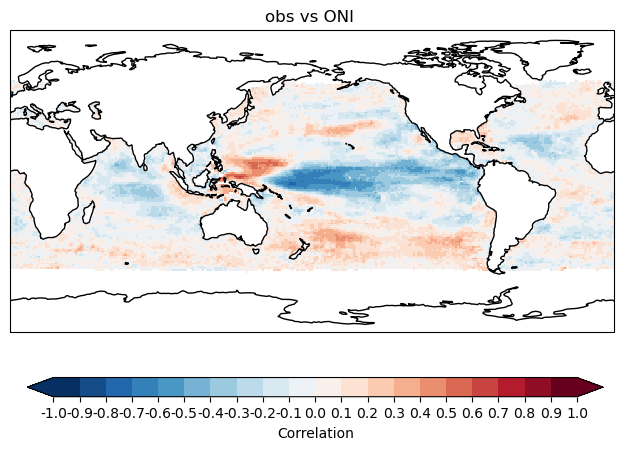

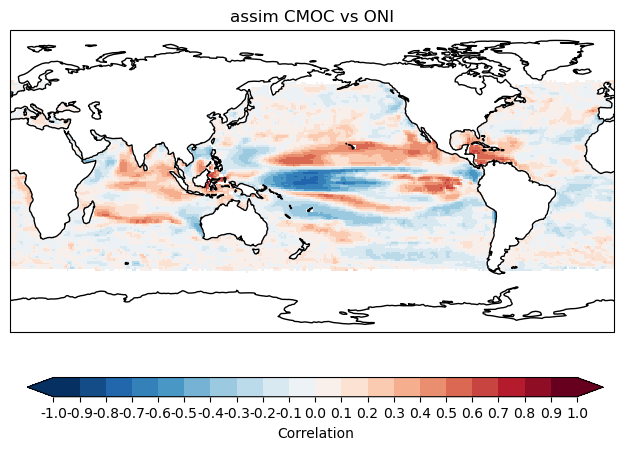

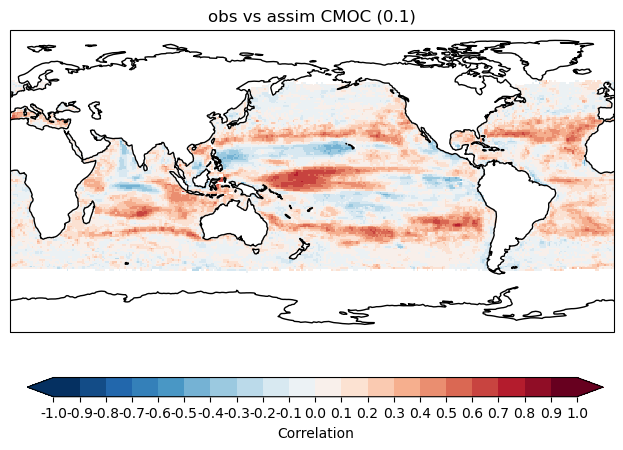

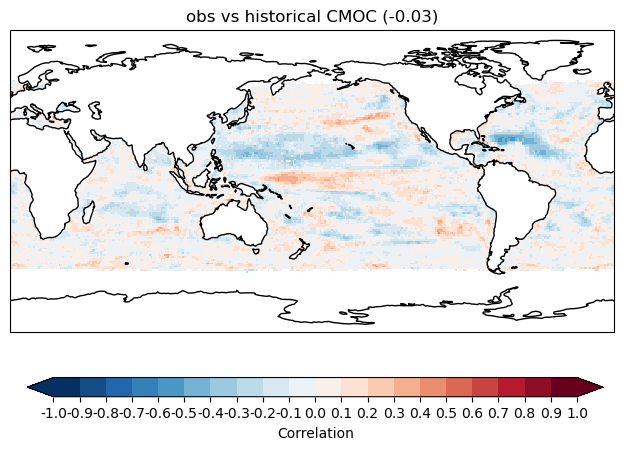

In [66]:
# from module_plot_maps import plot_single_map_wmo
obs_sim = xr.corr(dict_tpl['anom']['obs'], dict_tpl['anom']['historical_CMOC'], dim = 'ref')
obs_asm = xr.corr(dict_tpl['anom']['obs'], dict_tpl['anom']['assim_CMOC'], dim = 'ref')
obs_oni_corr =  xr.corr(dict_tpl['anom']['obs'], ONI_obs, dim = 'ref')
asm_oni_corr =  xr.corr(dict_tpl['anom']['assim_CMOC'], ONI_assm, dim = 'ref')




plot_single_map_wmo(add_cyclic_point(obs_oni_corr),lat=add_cyclic_point(obs_oni_corr).lat,lon=add_cyclic_point(obs_oni_corr).lon,central_longitude=-180,lat_lims=[-90,90],cmap=mpl.cm.RdBu_r,vmin=-1,vmax=1,cbar_label='Correlation',title = 'obs vs ONI ' , show_mean=False, figsize=None, show = True,cbar=True,nvals=20,)

plot_single_map_wmo(add_cyclic_point(asm_oni_corr),lat=add_cyclic_point(asm_oni_corr).lat,lon=add_cyclic_point(asm_oni_corr).lon,central_longitude=-180,lat_lims=[-90,90],cmap=mpl.cm.RdBu_r,vmin=-1,vmax=1,cbar_label='Correlation',title = 'assim CMOC vs ONI' , show_mean=False,figsize=None, show = True,cbar=True,nvals=20,)

plot_single_map_wmo(add_cyclic_point(obs_asm),lat=add_cyclic_point(obs_asm).lat,lon=add_cyclic_point(obs_asm).lon,central_longitude=-180,lat_lims=[-90,90],cmap=mpl.cm.RdBu_r,vmin=-1,vmax=1,cbar_label='Correlation',title = 'obs vs assim CMOC' , figsize=None, show = True,cbar=True,nvals=20,)

plot_single_map_wmo(add_cyclic_point(obs_sim),lat=add_cyclic_point(obs_sim).lat,lon=add_cyclic_point(obs_sim).lon,central_longitude=-180,lat_lims=[-90,90],cmap=mpl.cm.RdBu_r,vmin=-1,vmax=1,cbar_label='Correlation',title = 'obs vs historical CMOC' , figsize=None, show = True,cbar=True,nvals=20,)


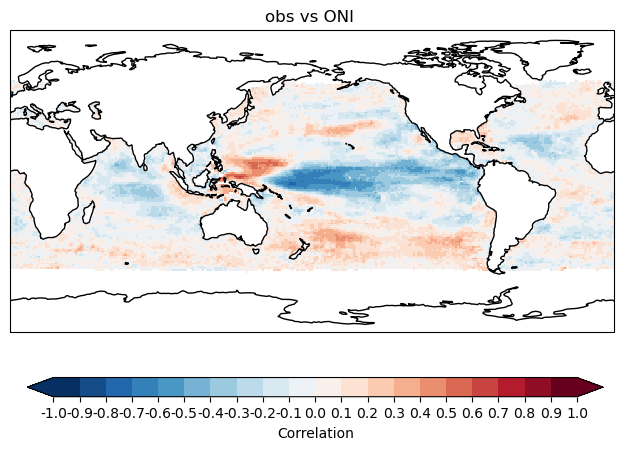

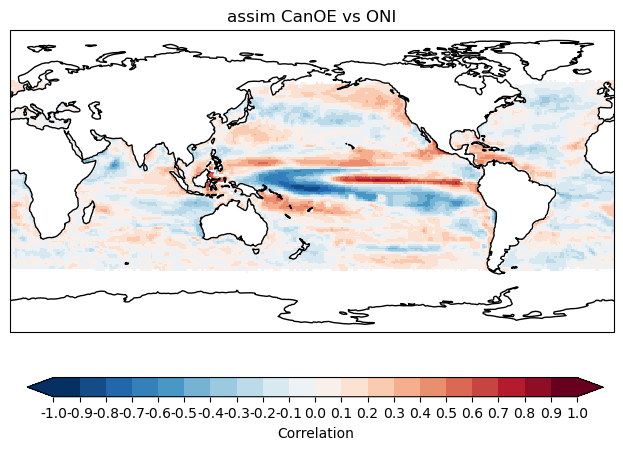

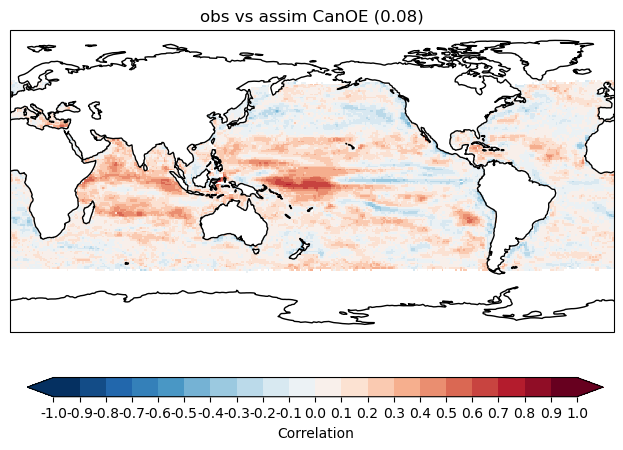

In [68]:
obs_asm = xr.corr(dict_tpl['anom']['obs'], dict_tpl['anom']['assim_CanOE'], dim = 'ref')
obs_oni_corr =  xr.corr(dict_tpl['anom']['obs'], ONI_obs, dim = 'ref')
asm_oni_corr =  xr.corr(dict_tpl['anom']['assim_CanOE'], ONI_assm, dim = 'ref')



plot_single_map_wmo(add_cyclic_point(obs_oni_corr),lat=add_cyclic_point(obs_oni_corr).lat,lon=add_cyclic_point(obs_oni_corr).lon,central_longitude=-180,lat_lims=[-90,90],cmap=mpl.cm.RdBu_r,vmin=-1,vmax=1,cbar_label='Correlation',title = 'obs vs ONI ' , show_mean = False, figsize=None, show = True,cbar=True,nvals=20,)

plot_single_map_wmo(add_cyclic_point(asm_oni_corr),lat=add_cyclic_point(asm_oni_corr).lat,lon=add_cyclic_point(asm_oni_corr).lon,central_longitude=-180,lat_lims=[-90,90],cmap=mpl.cm.RdBu_r,vmin=-1,vmax=1,cbar_label='Correlation',title = 'assim CanOE vs ONI' ,show_mean = False,  figsize=None, show = True,cbar=True,nvals=20,)

plot_single_map_wmo(add_cyclic_point(obs_asm),lat=add_cyclic_point(obs_asm).lat,lon=add_cyclic_point(obs_asm).lon,central_longitude=-180,lat_lims=[-90,90],cmap=mpl.cm.RdBu_r,vmin=-1,vmax=1,cbar_label='Correlation',title = 'obs vs assim CanOE' , figsize=None, show = True,cbar=True,nvals=20,)

